In [1]:
import pandas as pd

df = pd.read_pickle("./data/post-processed-metrics-dataframe.pkl")

In [2]:
workflow_regex = r'^([^-]+)'
df["workflow"] = df["dag"].str.extract(workflow_regex)

# Descriptive Statistics

In [3]:
df.columns

Index(['dag', 'system', 'scheduler', 'completed', 'makespan', 'exec_time',
       'run_stats.scheduling_time', 'run_stats.total_task_time',
       'run_stats.total_network_traffic', 'run_stats.total_network_time',
       'run_stats.max_used_cores', 'run_stats.max_used_memory',
       'run_stats.max_cpu_utilization', 'run_stats.max_memory_utilization',
       'run_stats.cpu_utilization', 'run_stats.memory_utilization',
       'run_stats.used_resource_count', 'run_stats.cpu_utilization_used',
       'run_stats.memory_utilization_used', 'run_stats.cpu_utilization_active',
       'run_stats.memory_utilization_active', 'run_stats.expected_makespan',
       'dag_path', 'system_path', 'dag_nodes', 'dag_edges', 'dag_density',
       'speedup', 'processor_count', 'core_count', 'efficiency_processors',
       'efficiency_cores', 'network_bandwidth', 'network_latency',
       'network_model', 'SLR', 'workflow'],
      dtype='object')

In [4]:
cols = ["makespan","exec_time","dag_nodes","dag_edges", "dag_density",
        "speedup", "efficiency_processors", "efficiency_cores", "SLR",
       "scheduler"]
means = df[cols].groupby("scheduler").mean()

Below we see that that, based on the normalized makespan (`SLR`), `HEFT` has the lowest mean `SLR` followed by `DLS`, then `DynamicList`. The "best" `DYTAS` variant based on this alone would be where it navigates all tasks in the current `PTQ`, uses `DFS` for sorting tasks, and uses all available cores in the processor.

Another thing to notices is how simply using `all cores` available minimizes `SLR` in `DYTAS`.

Further analysis required to determine whether `Khan` or `DFS` are better for sorting.

In [5]:
means[["SLR"]].sort_values(by="SLR")

,SLR
scheduler,
HEFT,172.791493
DLS,172.802363
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",174.229101
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",174.603084
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",174.659744
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",174.721715
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",177.153828
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",179.735548
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",179.784896


Below we see, with the `makespan`, the same results as before, which suggests that the way `SLR` is being calculated accurately.

In [6]:
means[["makespan"]].sort_values(by="makespan")

,makespan
scheduler,
HEFT,30140.958109
DLS,30146.289865
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",30185.946040
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",30282.909871
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",30306.967385
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",30328.326716
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",30760.297794
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",31953.963560
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",32011.552303


In terms of how long the algorithm took to converge to a final solution, the pattern changes. All `DYTAS` variants end up taking, on average, less time than all the other schedulers, `DLS` taking 50 times longer than `HEFT` and 388 times longer than the fastest algorithm on average.

Important to note, this is just the execution time of the algorithm. It does not represent makespan performance.

In [7]:
means[["exec_time"]].sort_values(by="exec_time")

,exec_time
scheduler,
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",0.014595
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",0.016482
"DYTAS[navigation=Front,sorting=DFS,multicore=SkipActiveProcessors]",0.023460
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",0.024084
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",0.024502
"DYTAS[navigation=Front,sorting=Khan,multicore=SkipActiveProcessors]",0.025355
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",0.026249
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",0.026281
HEFT,0.035404


In [8]:
5.665025 / 0.111311

50.89366729254072

In [9]:
5.665025 / 0.014595

388.14833847207944

Below we see that `HEFT`, quickly followed by `DLS`, achieve -on average- the best speedups w.r.t. all other algorithms. All `DYTAS` variants end up in last place, but we see a similar pattern to the mean `SLR` per algorithm in terms of hierarchy: navigating all tasks, using `DFS` for sorting, als using all available cores achieved the largest speedup in comparison to the rest of the `DYTAS` variants.

Further analysis is required to determine whether `Khan` or `DFS` are best sorting methods.

In [10]:
means[["speedup"]].sort_values(by="speedup", ascending=False)

,speedup
scheduler,
HEFT,19.406663
DLS,19.355288
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",17.279120
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",16.041361
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",15.855145
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",15.104203
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",10.672198
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",5.824928
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",5.810751


Below we see a similar pattern to before. `HEFT`, on average, has the best cores efficiency out of all. All `DYTAS` variants are last.

In [11]:
means[["efficiency_cores"]].sort_values(by="efficiency_cores", ascending=False)

,efficiency_cores
scheduler,
HEFT,0.437060
DLS,0.435635
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",0.403103
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",0.382910
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",0.379793
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",0.369700
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",0.298138
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",0.256883
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",0.255937


Here we see the same as before, and we see a stronger dip in efficiency when `DYTAS` does not use all cores available.

In [12]:
means[["efficiency_processors"]].sort_values(by="efficiency_processors", ascending=False)

,efficiency_processors
scheduler,
HEFT,2.510757
DLS,2.505892
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",2.249316
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",2.102322
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",2.077707
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",1.969350
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",1.397696
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",0.668725
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",0.667665


In [13]:
medians = df[cols].groupby("scheduler").median()

In [14]:
medians[["SLR"]].sort_values(by="SLR")

,SLR
scheduler,
HEFT,1.447366
DLS,1.454858
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",1.694747
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",1.971757
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",2.013060
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",2.130201
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",3.124691
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",5.124313
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",5.125658


In terms of medians, we see here an edge from a `DYTAS` variant w.r.t. `DynamicList`.

In [15]:
medians[["makespan"]].sort_values(by="makespan")

,makespan
scheduler,
HEFT,396.729215
DLS,396.732309
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",436.613850
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",442.874830
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",454.810668
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",471.047007
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",766.527884
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",1016.444779
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",1018.415053


In [16]:
medians[["exec_time"]].sort_values(by="exec_time")

,exec_time
scheduler,
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",0.007887
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",0.007894
"DYTAS[navigation=Front,sorting=DFS,multicore=SkipActiveProcessors]",0.008129
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",0.008462
"DYTAS[navigation=Front,sorting=Khan,multicore=SkipActiveProcessors]",0.008700
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",0.008799
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",0.008841
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",0.008961
HEFT,0.013287


In [17]:
medians[["speedup"]].sort_values(by="speedup", ascending=False)

,speedup
scheduler,
HEFT,11.911275
DLS,11.911275
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",11.119757
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",10.322029
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",10.056317
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",9.931890
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",7.043853
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",4.565832
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",4.535916


In [18]:
medians[["efficiency_cores"]].sort_values(by="efficiency_cores", ascending=False)

,efficiency_cores
scheduler,
DLS,0.407135
HEFT,0.406756
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",0.346001
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",0.318270
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",0.313928
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",0.297747
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",0.187085
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",0.084401
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",0.084260


In [19]:
medians[["efficiency_processors"]].sort_values(by="efficiency_processors", ascending=False)

,efficiency_processors
scheduler,
DLS,1.085090
HEFT,1.085090
"DynamicList[task=CompSize,resource=Speed,cores=MaxCores]",1.039581
"DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]",0.989582
"DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]",0.988343
"DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]",0.983092
"DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]",0.803130
"DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]",0.674651
"DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]",0.672391


In [20]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

In [21]:
df["SLR"].min()

1.0000000037317578

In [22]:
df["SLR"].max()

94277.09025707922

In [23]:
df["SLR"].median()

2.827247893927927

In [24]:
df["SLR"].mean()

176.55630084386564

## Distributions

Conclusion: Data is not normally distributed. Seems heavily skewed on most cases.

<Axes: xlabel='makespan'>

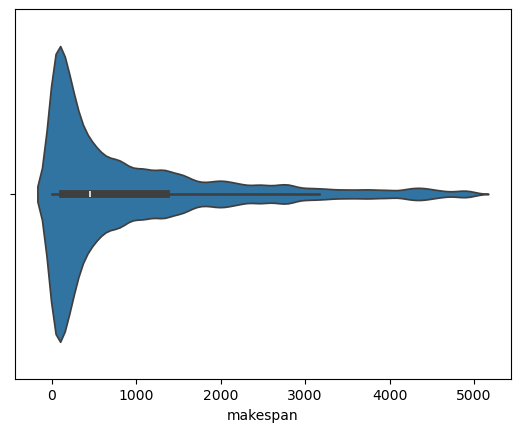

In [25]:
sns.violinplot(data=df[(df["makespan"] < 5000)], x="makespan")

<Axes: xlabel='makespan'>

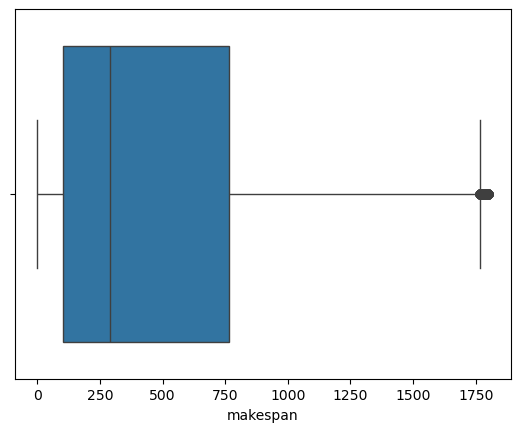

In [26]:
sns.boxplot(data=df[(df["makespan"] < 1800)], x="makespan")

<Axes: xlabel='SLR'>

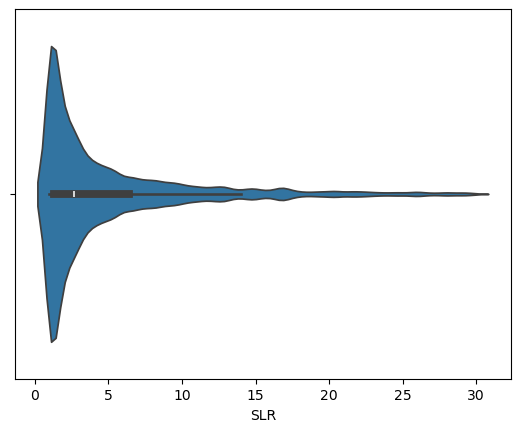

In [27]:
sns.violinplot(data=df[(df["SLR"] < 30)], x="SLR")

<Axes: xlabel='exec_time'>

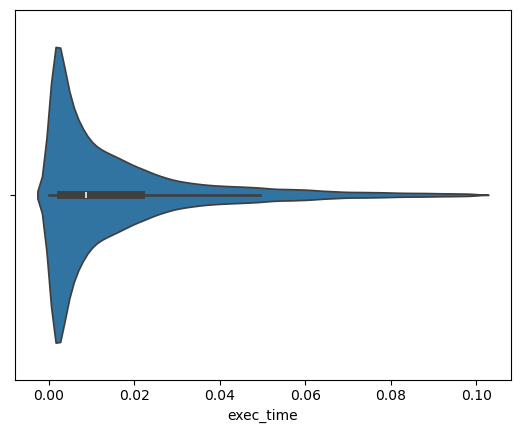

In [28]:
sns.violinplot(data=df[df["exec_time"] < .1], x="exec_time")

<Axes: xlabel='speedup'>

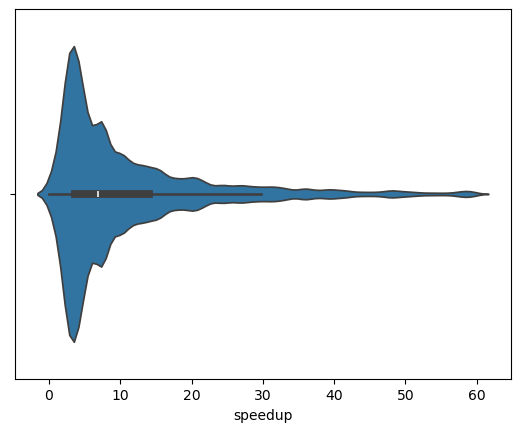

In [29]:
sns.violinplot(data=df[df["speedup"] < 60], x="speedup")

<Axes: xlabel='efficiency_processors'>

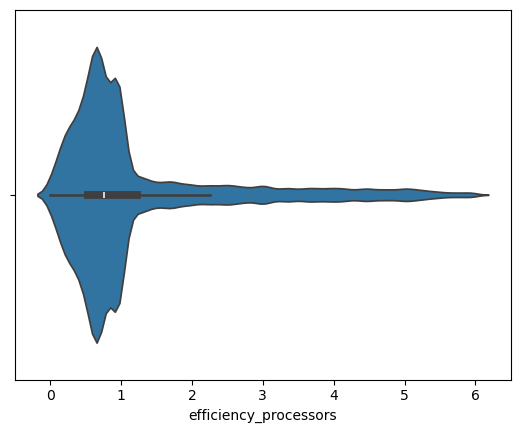

In [30]:
sns.violinplot(data=df[df["efficiency_processors"] < 6], x="efficiency_processors")

<Axes: xlabel='efficiency_cores'>

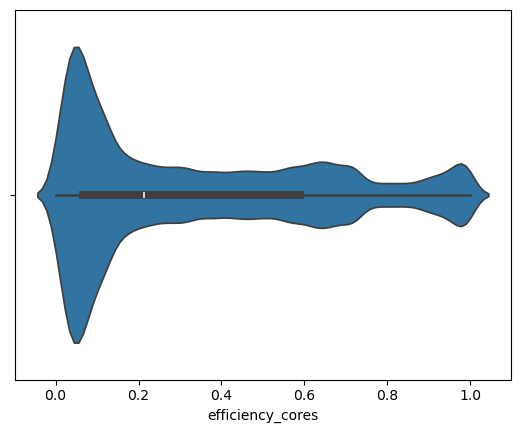

In [31]:
sns.violinplot(data=df, x="efficiency_cores")

<Axes: xlabel='dag_edges'>

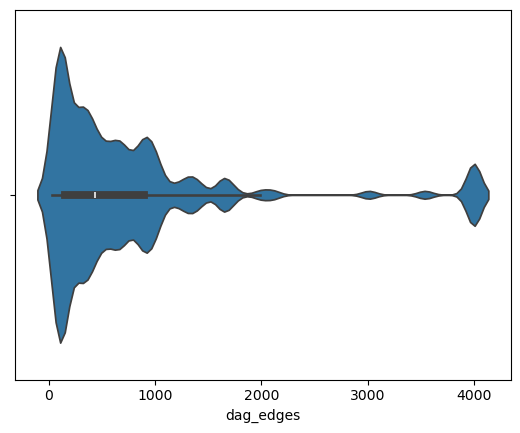

In [32]:
sns.violinplot(data=df, x="dag_edges")

<Axes: xlabel='dag_nodes'>

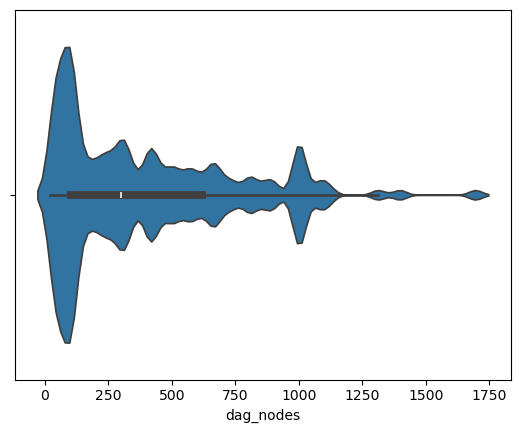

In [33]:
sns.violinplot(data=df, x="dag_nodes")

<Axes: xlabel='dag_density'>

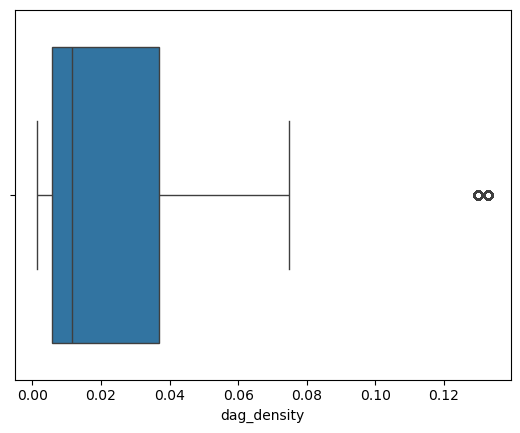

In [34]:
sns.boxplot(data=df, x="dag_density")

<Axes: xlabel='dag_density'>

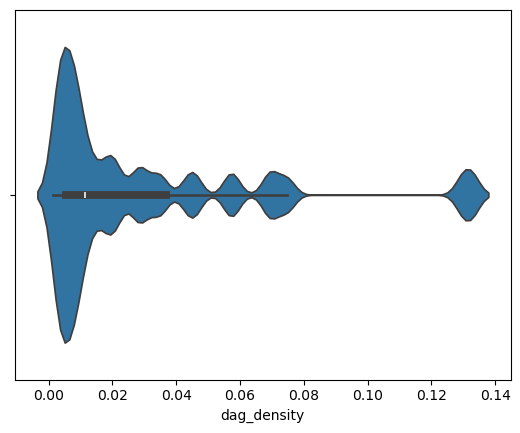

In [35]:
sns.violinplot(data=df, x="dag_density")

<Axes: xlabel='dag_density'>

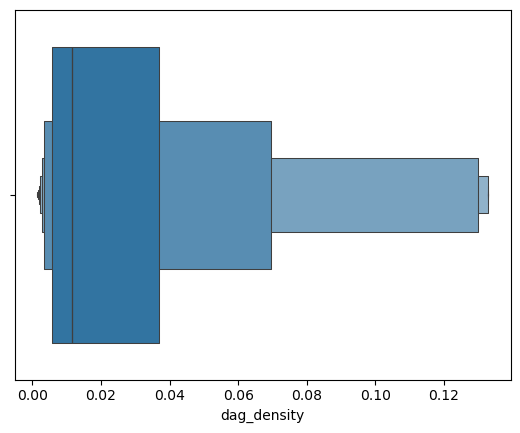

In [36]:
sns.boxenplot(data=df, x="dag_density")

As seen before, the skewness of the data makes it hard to use any normal distribution methods of analysis.

In [37]:
# sns.pairplot(df)

<Axes: xlabel='SLR', ylabel='exec_time'>

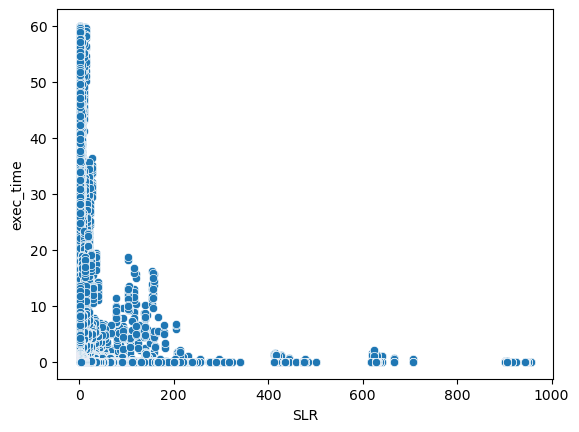

In [38]:
sns.scatterplot(df[(df["SLR"]<1000) & (df["exec_time"] < 60)], x="SLR", y="exec_time")

Below we see that there is not a strong relationship between number of tasks and the SLR, same with number of edges and SLR. This might indicate that some workflow might have less tasks but each task might require more FLOPs to complete than workflows with many tasks.

<Axes: xlabel='dag_nodes', ylabel='SLR'>

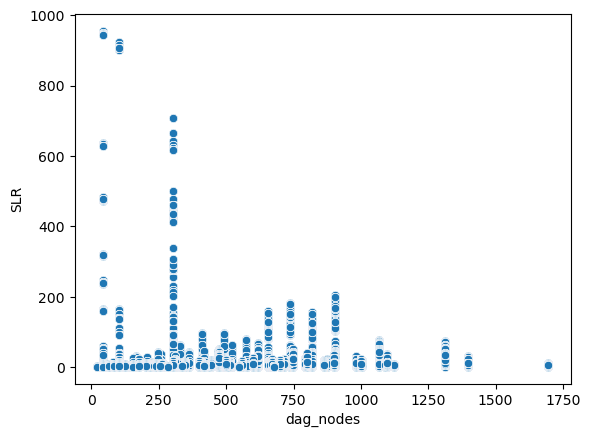

In [39]:
sns.scatterplot(df[(df["SLR"]<1000)], x="dag_nodes", y="SLR")

<Axes: xlabel='dag_edges', ylabel='SLR'>

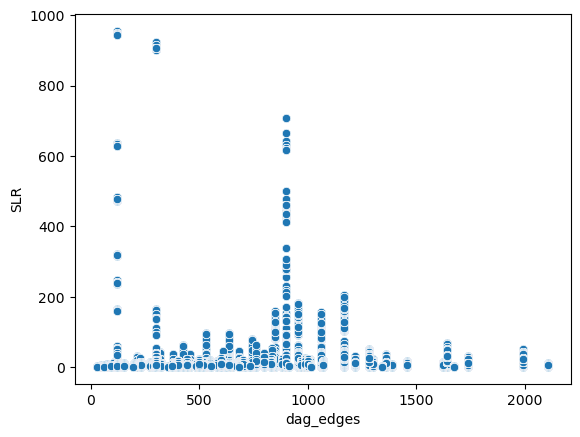

In [40]:
sns.scatterplot(df[(df["SLR"]<1000) & (df["dag_edges"] < 3000)], x="dag_edges", y="SLR")

<Axes: xlabel='SLR'>

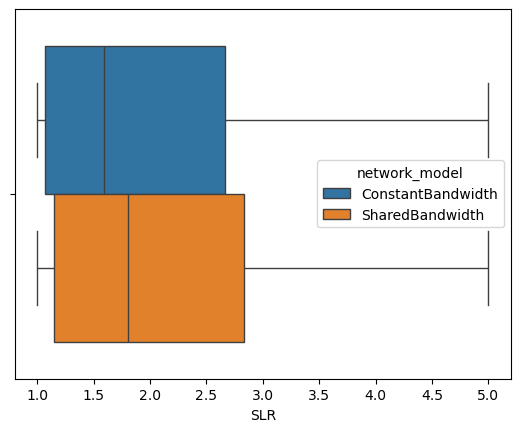

In [41]:
sns.boxplot(data=df[df["SLR"]< 5], x="SLR", hue="network_model")

<Axes: xlabel='makespan'>

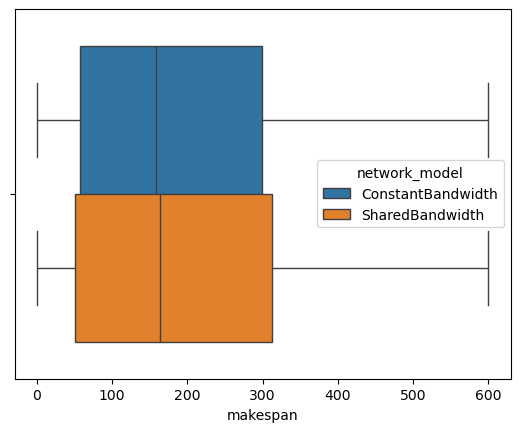

In [42]:
sns.boxplot(data=df[df["makespan"] < 600], x="makespan", hue="network_model")

<Axes: xlabel='SLR'>

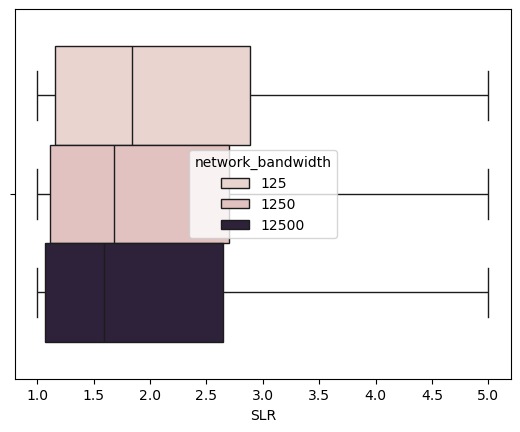

In [43]:
sns.boxplot(data=df[df["SLR"]< 5], x="SLR", hue="network_bandwidth")

<Axes: xlabel='makespan'>

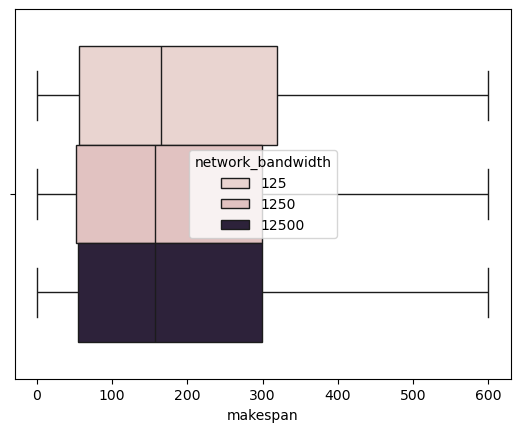

In [44]:
sns.boxplot(data=df[df["makespan"] < 600], x="makespan", hue="network_bandwidth")

<Axes: xlabel='SLR'>

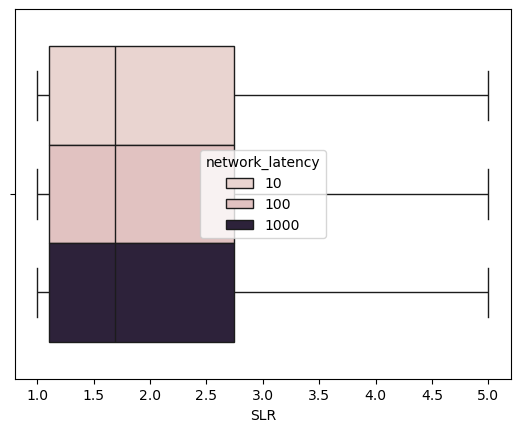

In [45]:
sns.boxplot(data=df[df["SLR"]< 5], x="SLR", hue="network_latency")

<Axes: xlabel='makespan'>

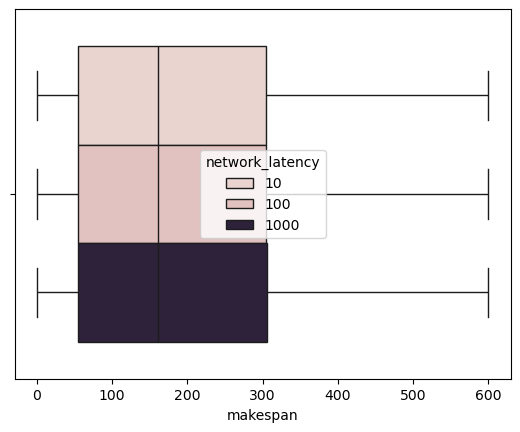

In [46]:
sns.boxplot(data=df[df["makespan"] < 600], x="makespan", hue="network_latency")

Important to note that depending on the workflow and the number of tasks in the DAG, the algorithms will represent varying behaviors that will be hard to plot smoothly.

<Axes: xlabel='workflow', ylabel='dag_nodes'>

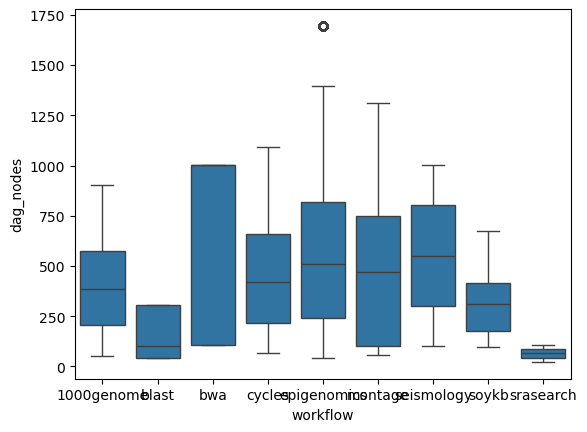

In [47]:
sns.boxplot(df, x="workflow", y="dag_nodes")

In [48]:
# df.columns

# Plotting efficiency per algorithm

The below efficiency figures suggest that the `DYTAS` variants that skip active processors have terrible efficiency compared to the rest.

Out of the `DYTAS` variants, the one with the best efficiency consistently is the one using `navigation=All, sorting=DFS, multicore=UseAllCores` followed by the one using `sorting=Khan`. Nonetheless, none of them reaches even the worst performing scheduler -in terms of efficiency- from the control group (`DynamicList`).

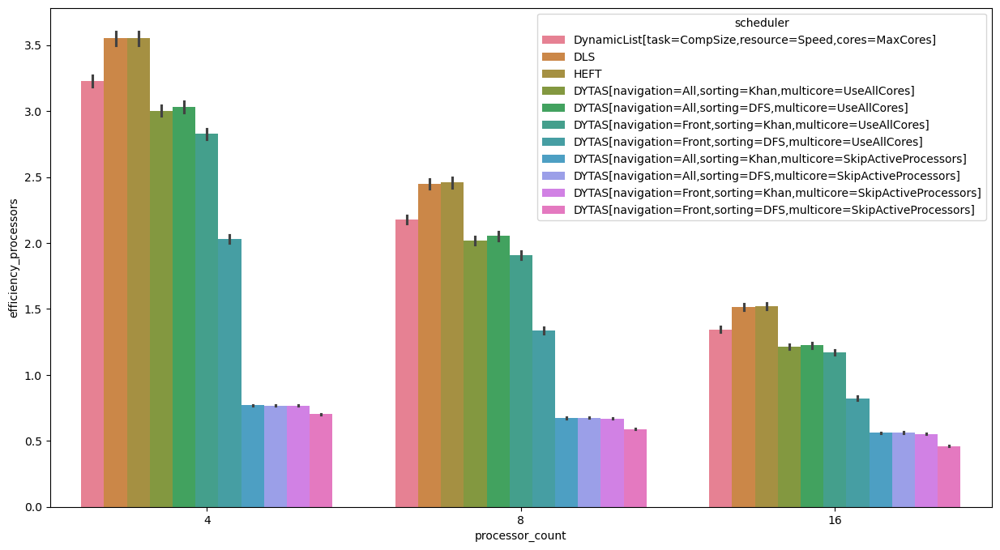

In [49]:


plt.figure(figsize=(15,8))
sns.barplot(data=df, x="processor_count", y="efficiency_processors", hue="scheduler")

plt.show()

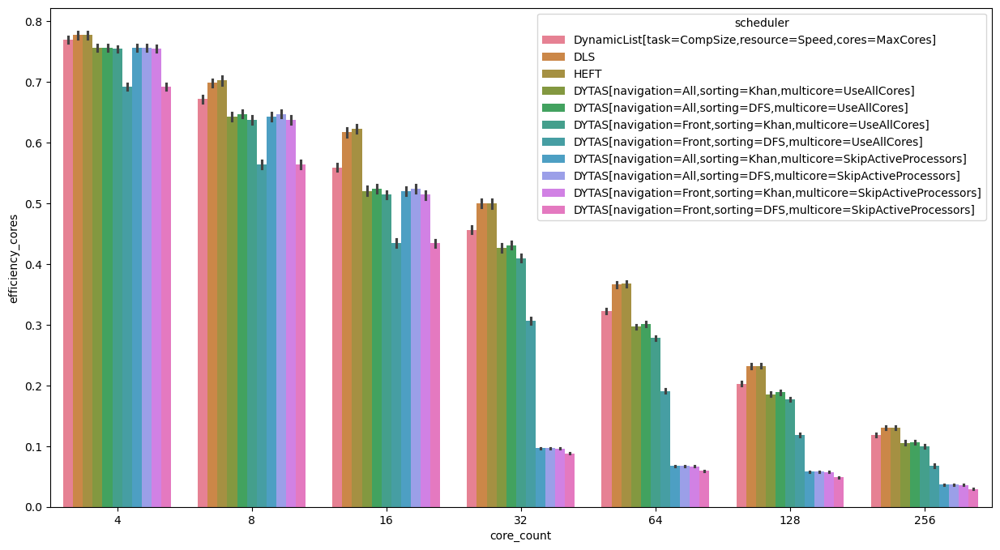

In [50]:
plt.figure(figsize=(15,8))

sns.barplot(data=df, x="core_count", y="efficiency_cores", hue="scheduler")

plt.show()

# Running time vs Processor count

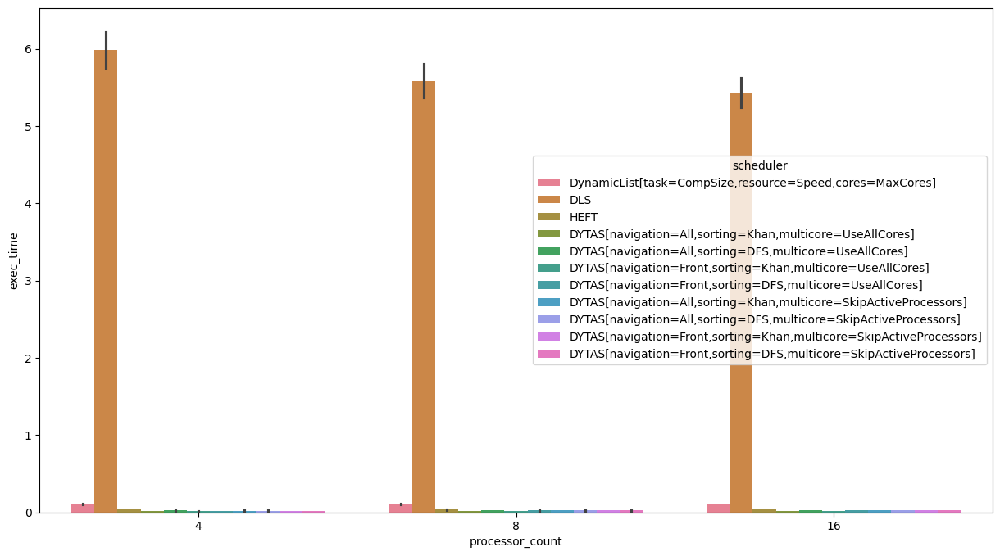

In [51]:
plt.figure(figsize=(15,8))

sns.barplot(data=df, x="processor_count", y="exec_time", hue="scheduler")

plt.show()

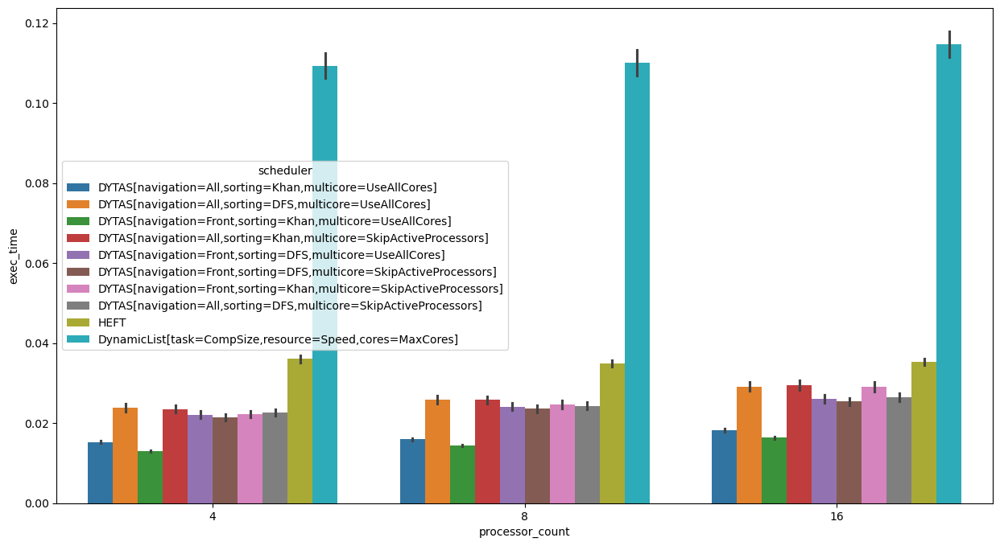

In [52]:
plt.figure(figsize=(15,8))

sns.barplot(
    data=df[df.scheduler != "DLS"].sort_values(
        by="exec_time"
    ),
    x="processor_count", y="exec_time", hue="scheduler"
)

plt.show()

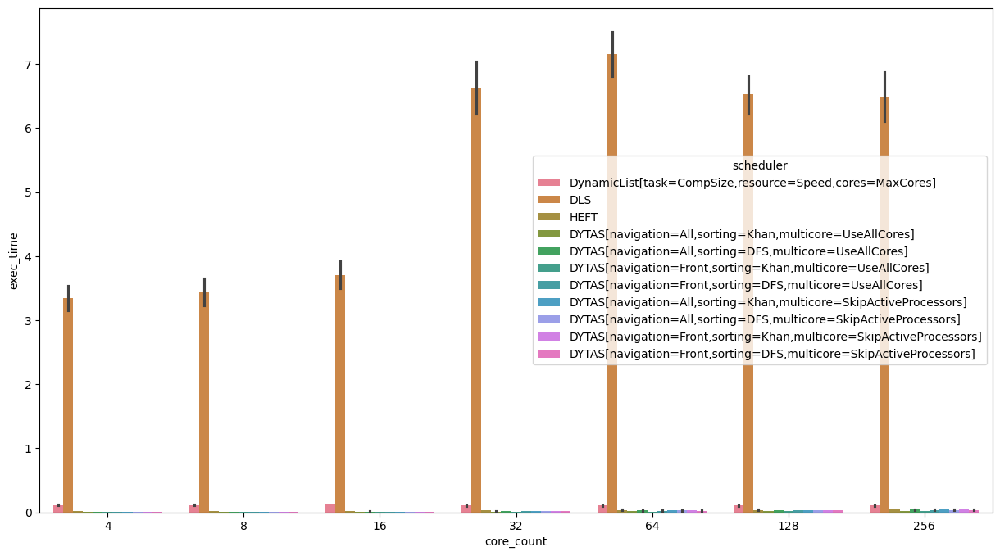

In [53]:
plt.figure(figsize=(15,8))

sns.barplot(data=df, x="core_count", y="exec_time", hue="scheduler")

plt.show()

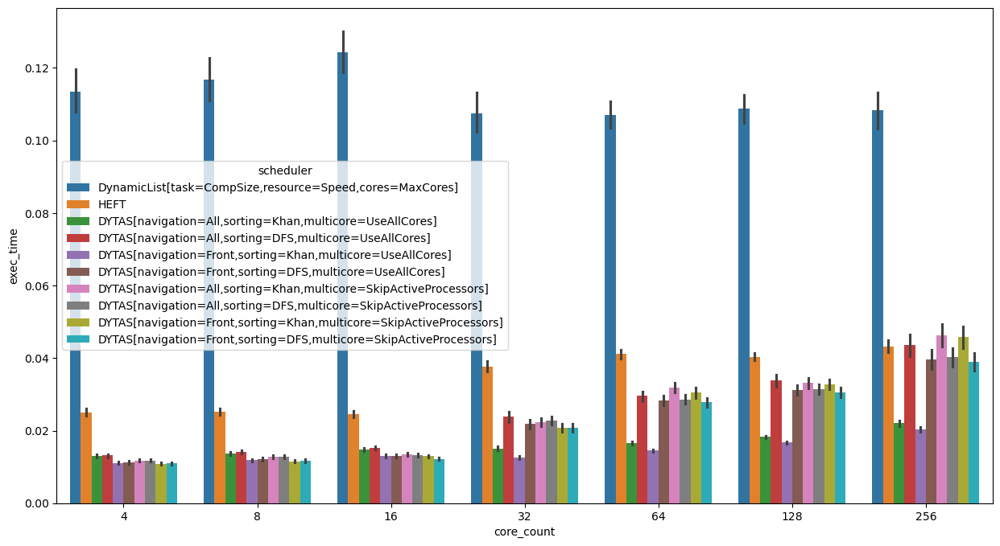

In [54]:
# Ignoring DLS
plt.figure(figsize=(15,8))

sns.barplot(data=df[df.scheduler != "DLS"], x="core_count", y="exec_time", hue="scheduler")

plt.show()

# SLR vs processor count

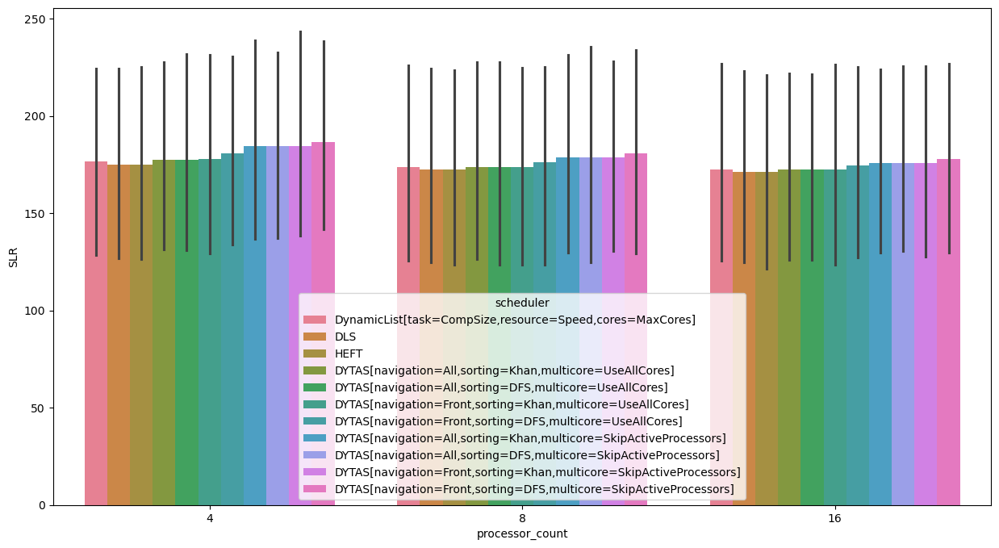

In [55]:
plt.figure(figsize=(15,8))

sns.barplot(data=df, x="processor_count", y="SLR", hue="scheduler")

plt.show()

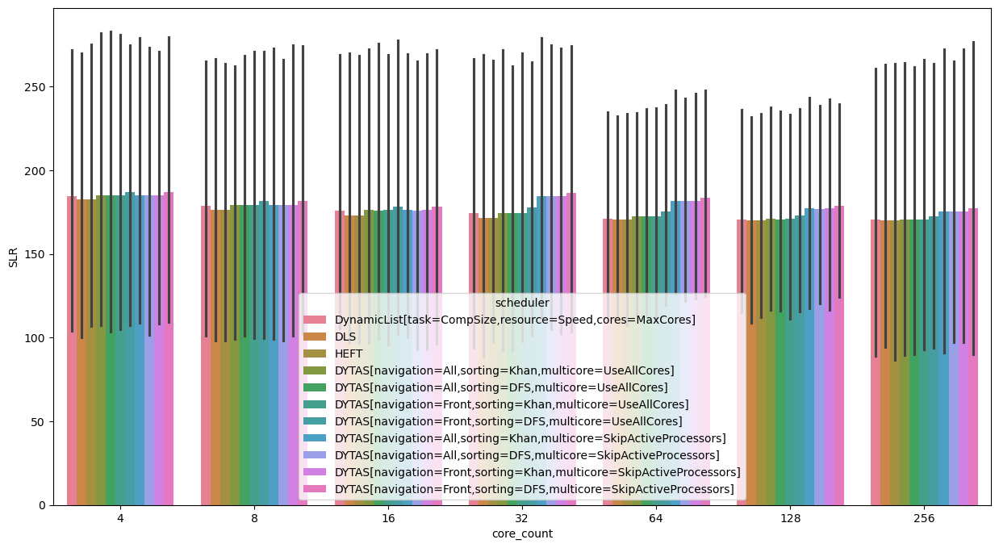

In [56]:
plt.figure(figsize=(15,8))

sns.barplot(data=df, x="core_count", y="SLR", hue="scheduler")

plt.show()

# Plotting mean SLR vs DAG node count

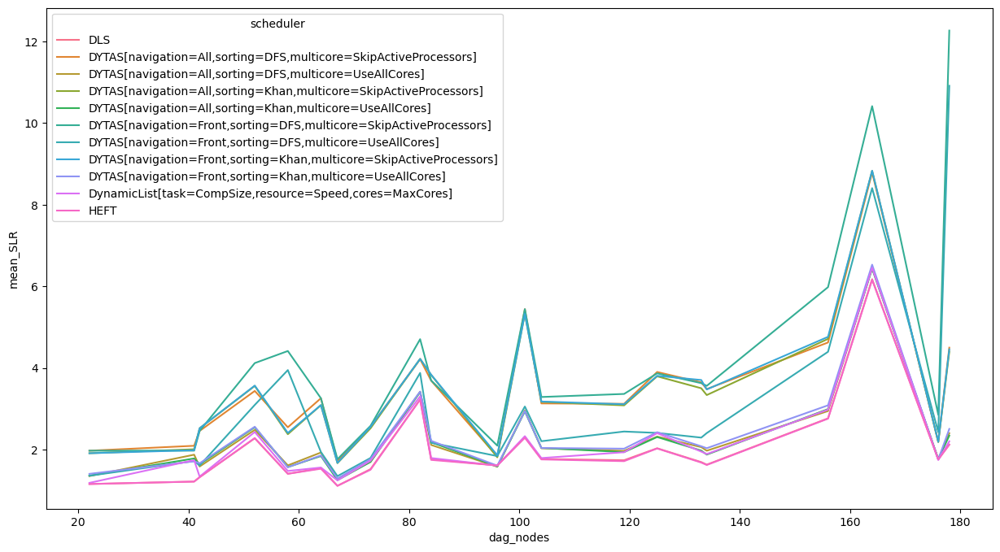

In [57]:
df_mean_slr = df[
    ["SLR", "scheduler", "dag_nodes"]
].groupby(["scheduler", "dag_nodes"]).mean().reset_index()
df_mean_slr = df_mean_slr.rename(columns={"SLR":"mean_SLR"})

plt.figure(figsize=(15,8))

sns.lineplot(
    data=df_mean_slr[
    (df_mean_slr["mean_SLR"]<20) & (df_mean_slr.dag_nodes < 200)],
    y="mean_SLR", x="dag_nodes", hue="scheduler"
)

plt.show()

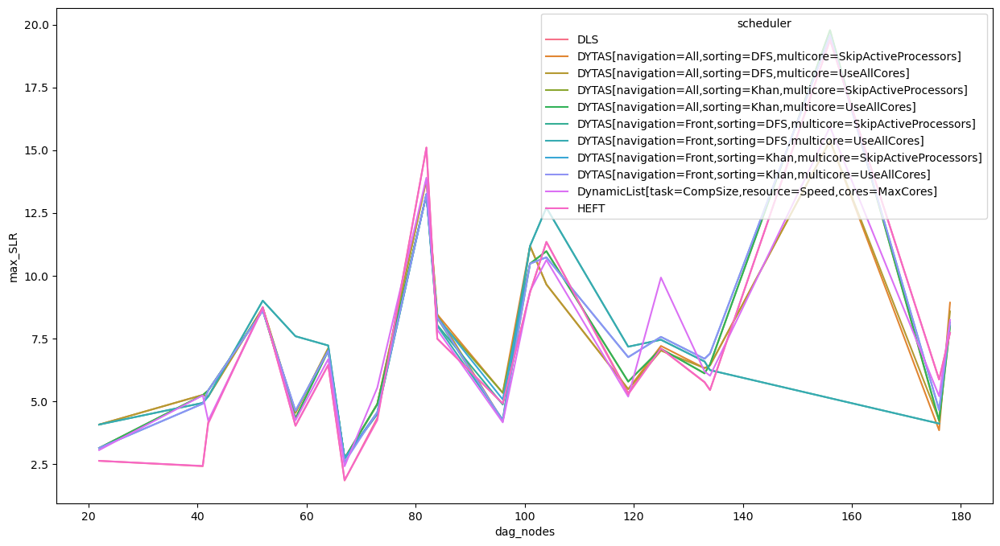

In [58]:
df_max_slr = df[
    ["SLR", "scheduler", "dag_nodes"]
].groupby(["scheduler", "dag_nodes"]).max().reset_index()
df_max_slr = df_max_slr.rename(columns={"SLR":"max_SLR"})

plt.figure(figsize=(15,8))

sns.lineplot(
    data=df_max_slr[
    (df_max_slr["max_SLR"]<20) & (df_max_slr.dag_nodes < 200)],
    y="max_SLR", x="dag_nodes", hue="scheduler"
)

plt.show()

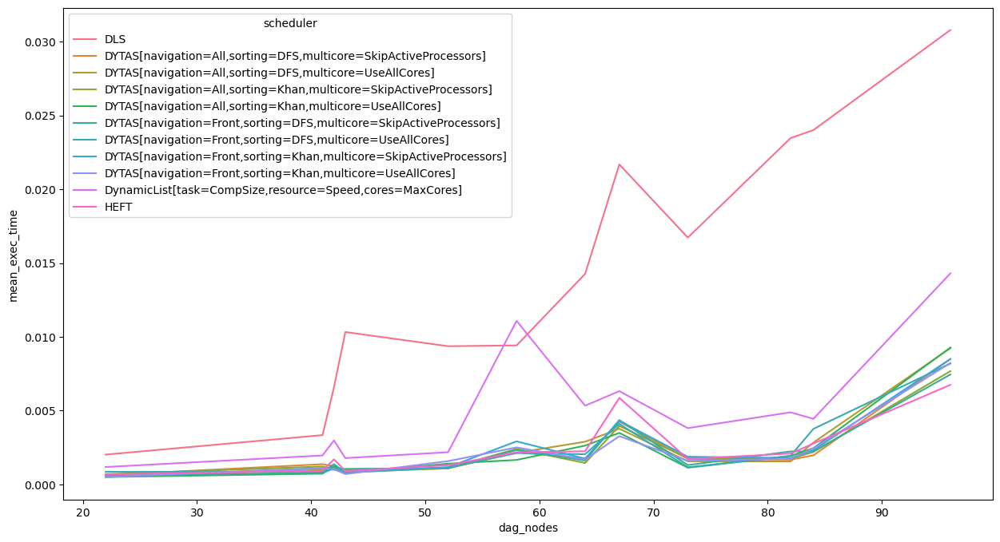

In [59]:
df_mean_exec_time = df[
    ["exec_time", "scheduler", "dag_nodes"]
].groupby(["scheduler", "dag_nodes"]).mean().reset_index()
df_mean_exec_time = df_mean_exec_time.rename(columns={"exec_time":"mean_exec_time"})

plt.figure(figsize=(15,8))

sns.lineplot(data=df_mean_exec_time[df_mean_exec_time.dag_nodes < 100], y="mean_exec_time", x="dag_nodes", hue="scheduler")

plt.show()

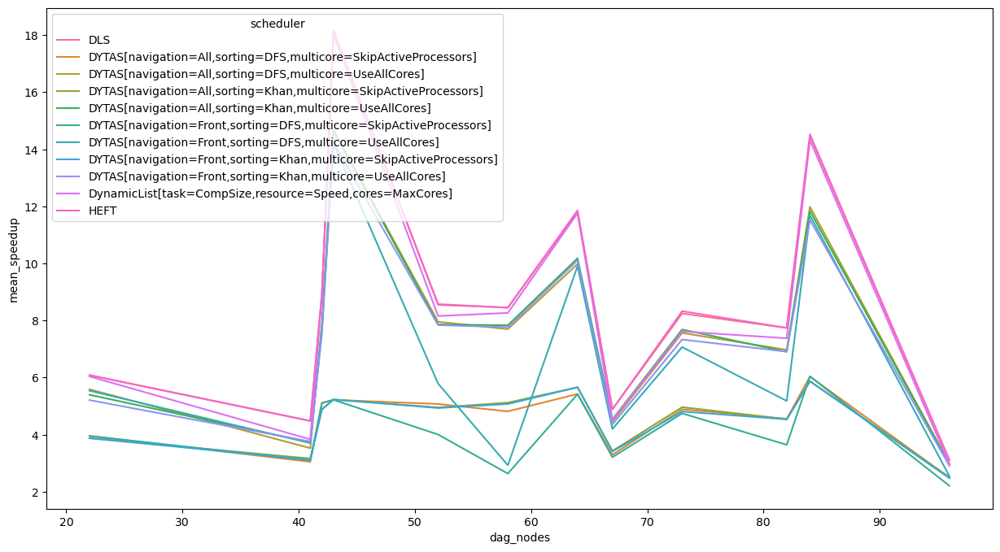

In [60]:
df_mean_speedup = df[
    ["speedup", "scheduler", "dag_nodes"]
].groupby(["scheduler", "dag_nodes"]).mean().reset_index()
df_mean_speedup = df_mean_speedup.rename(columns={"speedup":"mean_speedup"})

plt.figure(figsize=(15,8))

sns.lineplot(data=df_mean_speedup[df_mean_speedup.dag_nodes < 100], y="mean_speedup", x="dag_nodes", hue="scheduler")

plt.show()

In [61]:
df.workflow.unique()

array(['1000genome', 'blast', 'bwa', 'cycles', 'epigenomics', 'montage',
       'seismology', 'soykb', 'srasearch'], dtype=object)

In [62]:
df_epigenomics = df[df.workflow == "epigenomics"]

In [63]:
def plot_mean_slr(df):
    data=df
    data = data[
    ["SLR", "scheduler", "dag_nodes"]
    ].groupby(["scheduler", "dag_nodes"]).mean().reset_index()
    data = data.rename(columns={"SLR":"mean_SLR"})

    # Smoothing out
    data["mean_SLR_smoothed"] = data["mean_SLR"].rolling(window=5, center=True).mean()
    
    plt.figure(figsize=(15,8))

    plt.title("Mean SLR vs DAG node count")
    
    sns.lineplot(
        data=data,
        y="mean_SLR_smoothed", x="dag_nodes", hue="scheduler",
        marker='o'
    )
    
    plt.show()

We can in more detail see below how it each workflow does not scale smoothly up or down, for these test cases in particular.


1000genome


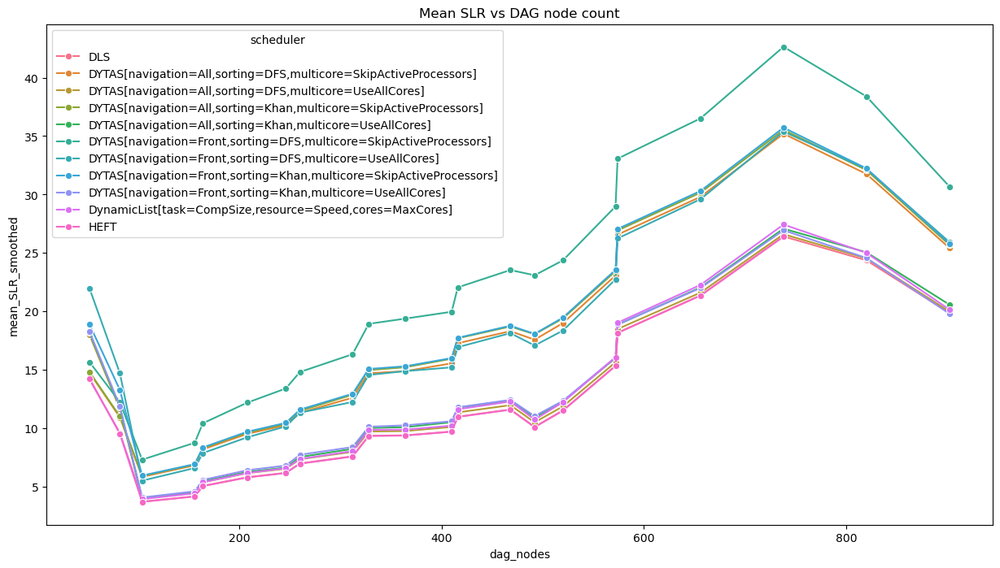

blast


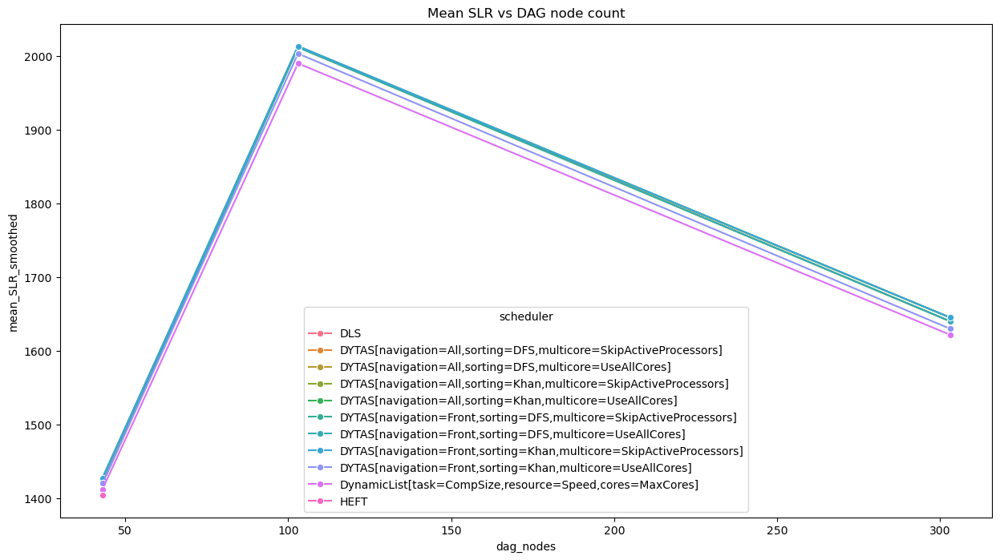

bwa


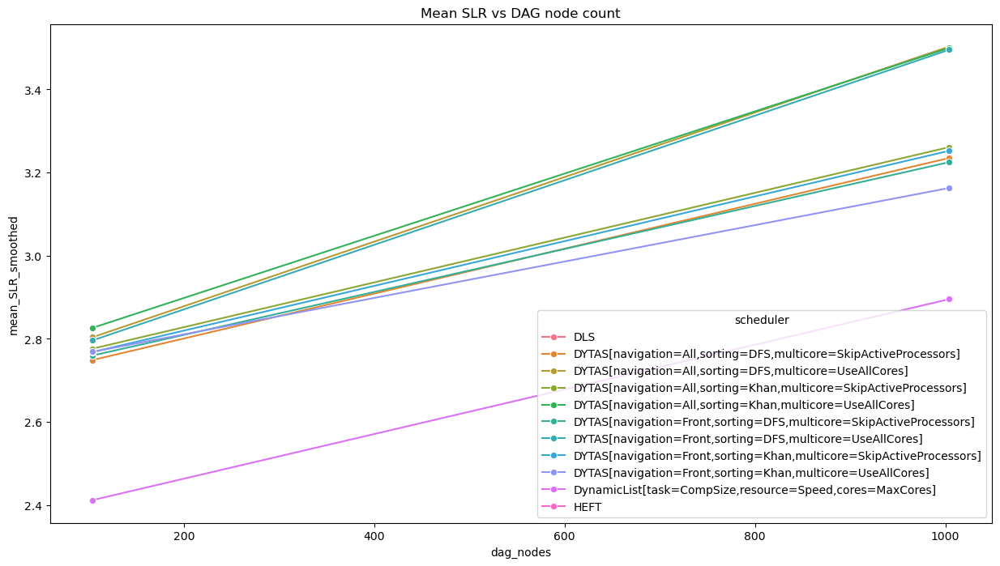

cycles


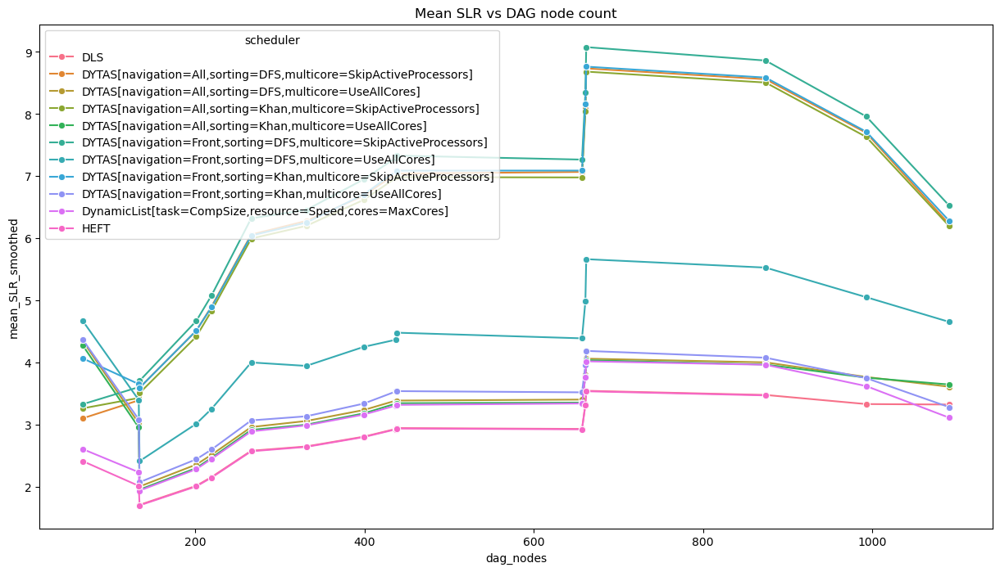

epigenomics


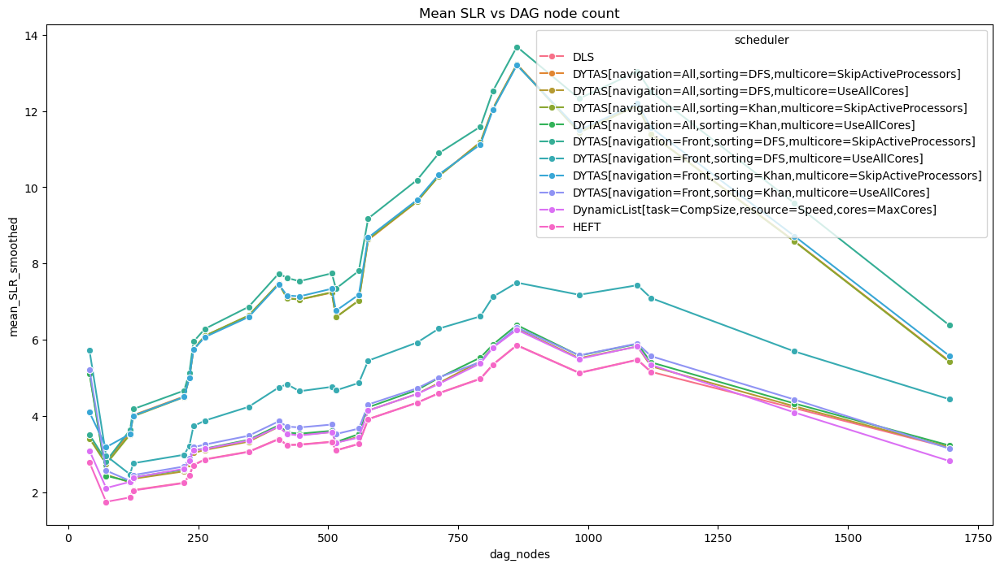

montage


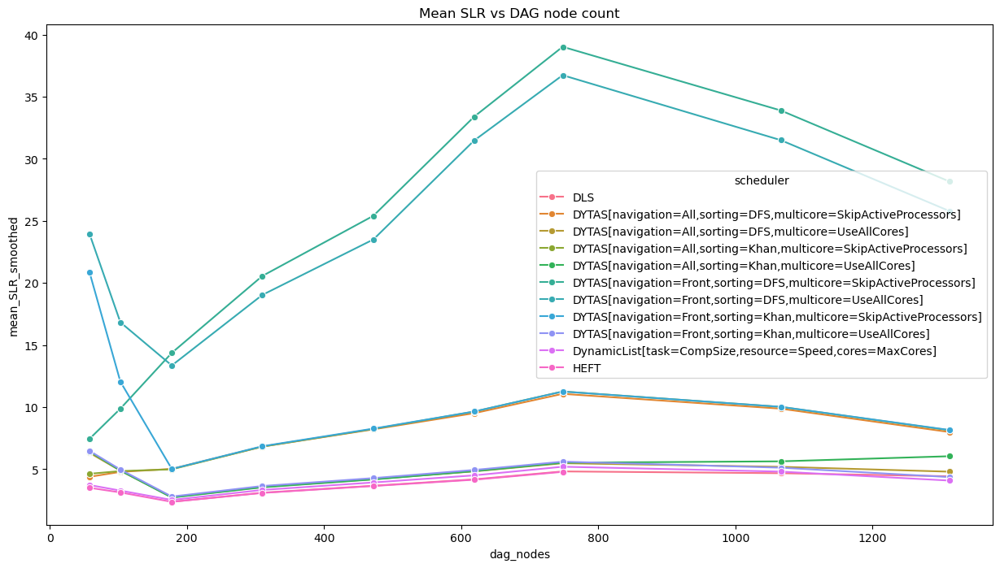

seismology


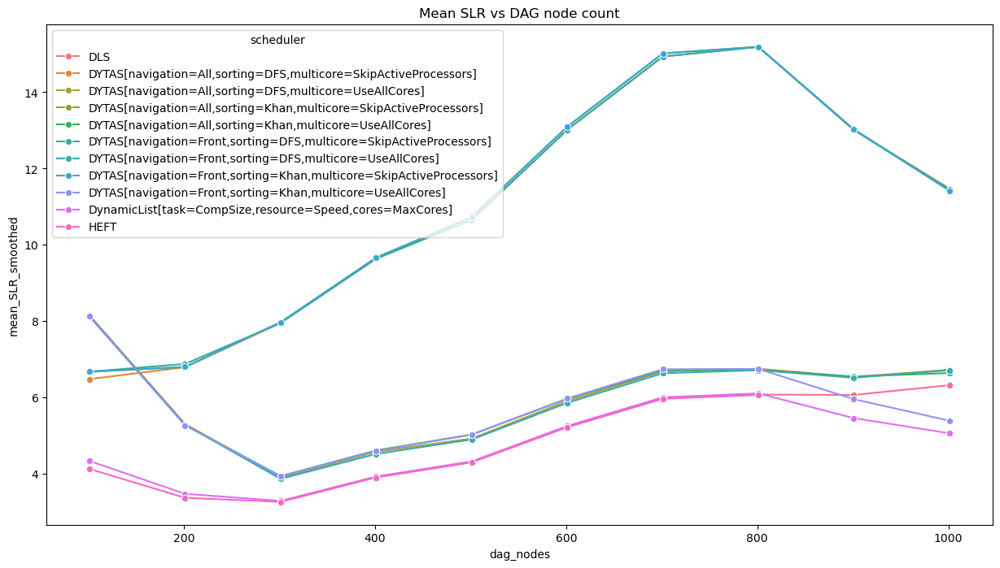

soykb


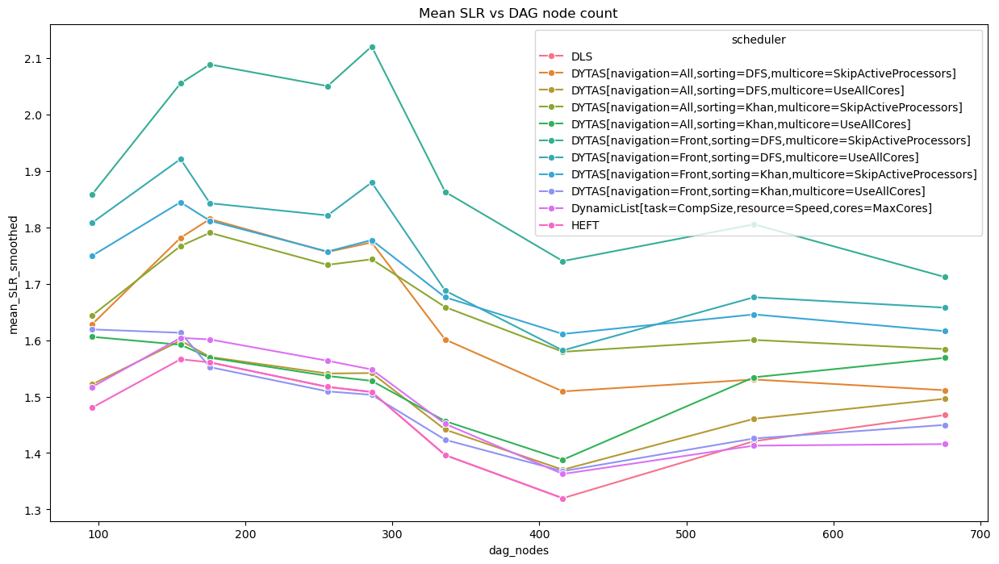

srasearch


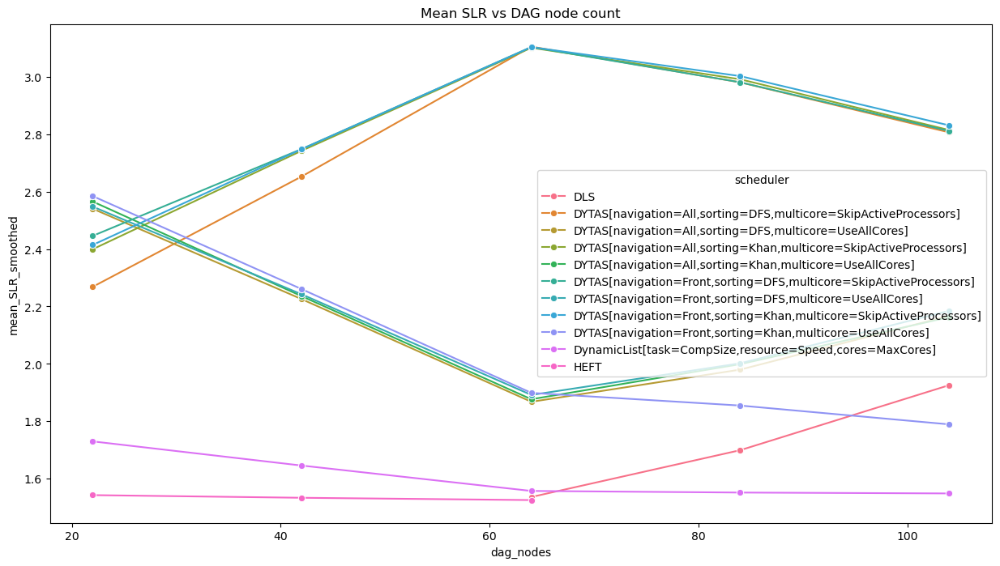

In [64]:
for workflow in df.workflow.unique():
    print(workflow)
    plot_mean_slr(df[df.workflow == workflow])

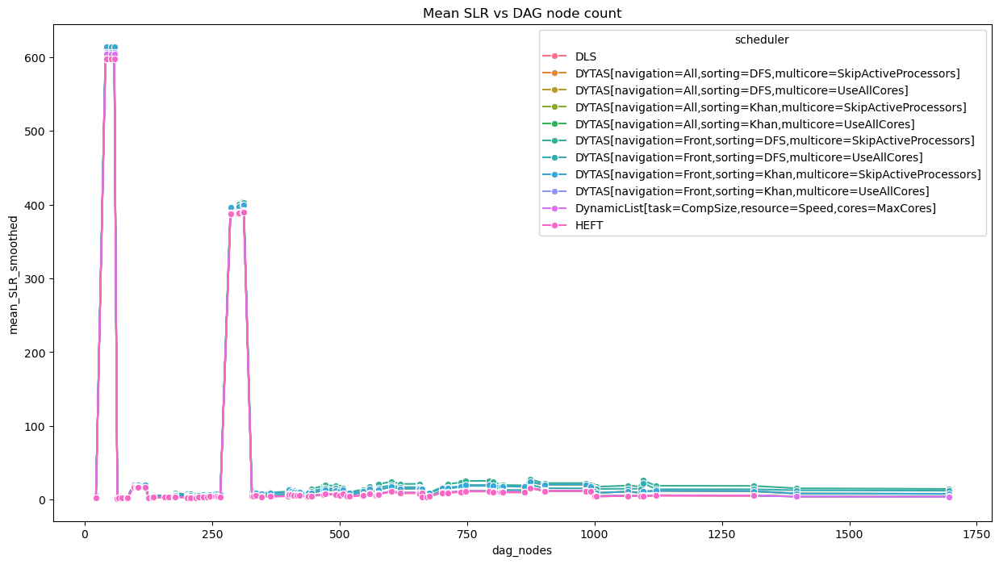

In [65]:
plot_mean_slr(df)

In [66]:
def plot_mean_speedup(df):
    data=df
    data = data[
    ["speedup", "scheduler", "dag_nodes"]
    ].groupby(["scheduler", "dag_nodes"]).mean().reset_index()
    data = data.rename(columns={"speedup":"mean_speedup"})

    # Smoothing out
    # data["mean_SLR_smoothed"] = data["mean_SLR"].rolling(window=5, center=True).mean()
    
    plt.figure(figsize=(15,8))

    plt.title("Mean speedup vs DAG node count")
    
    sns.lineplot(
        data=data,
        y="mean_speedup", x="dag_nodes", hue="scheduler",
        marker='o'
    )
    
    plt.show()

1000genome


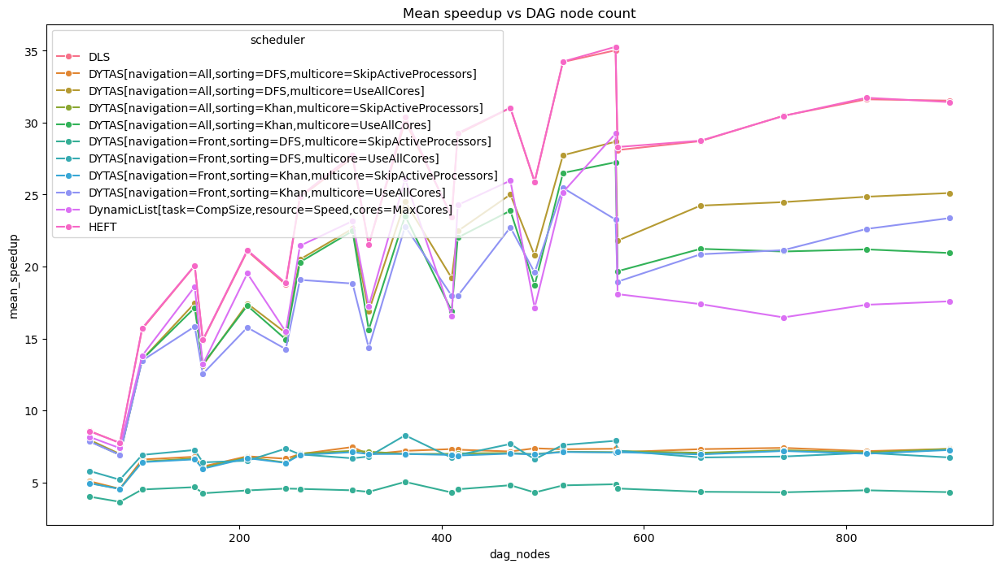

blast


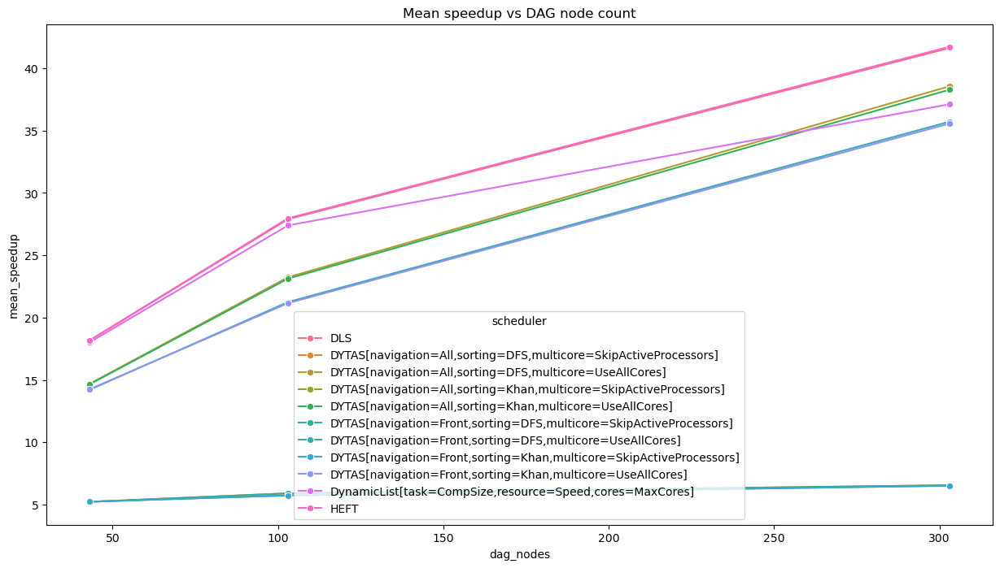

bwa


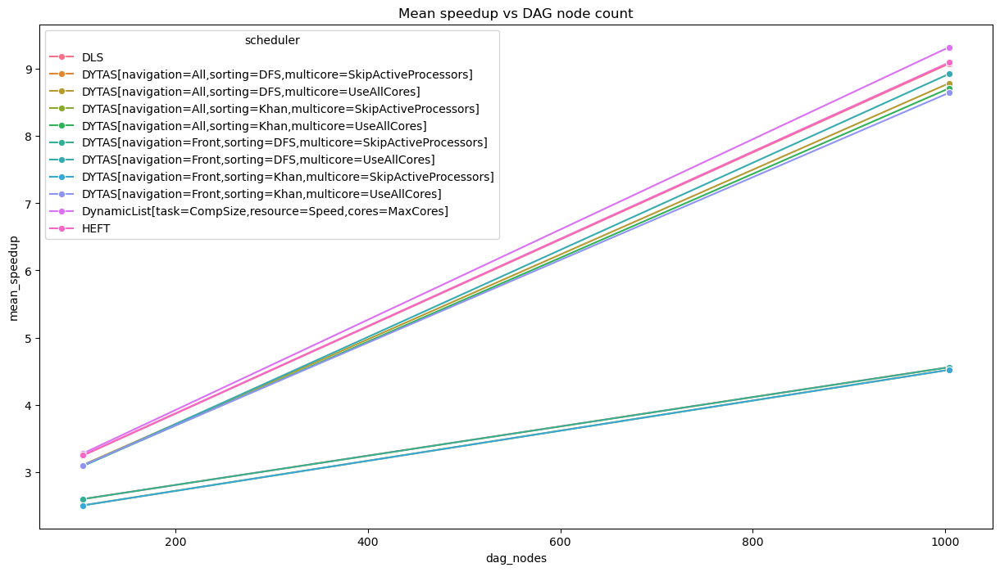

cycles


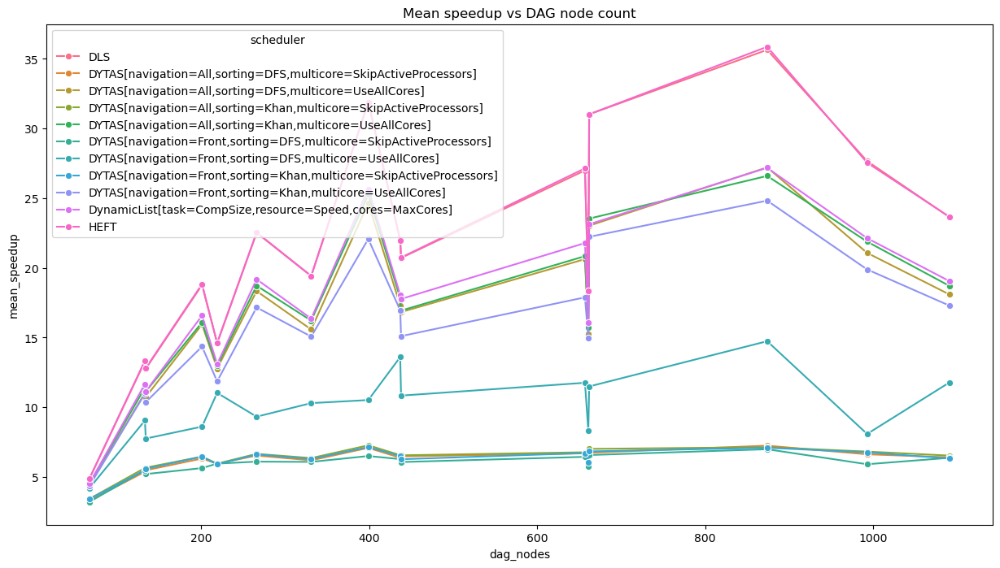

epigenomics


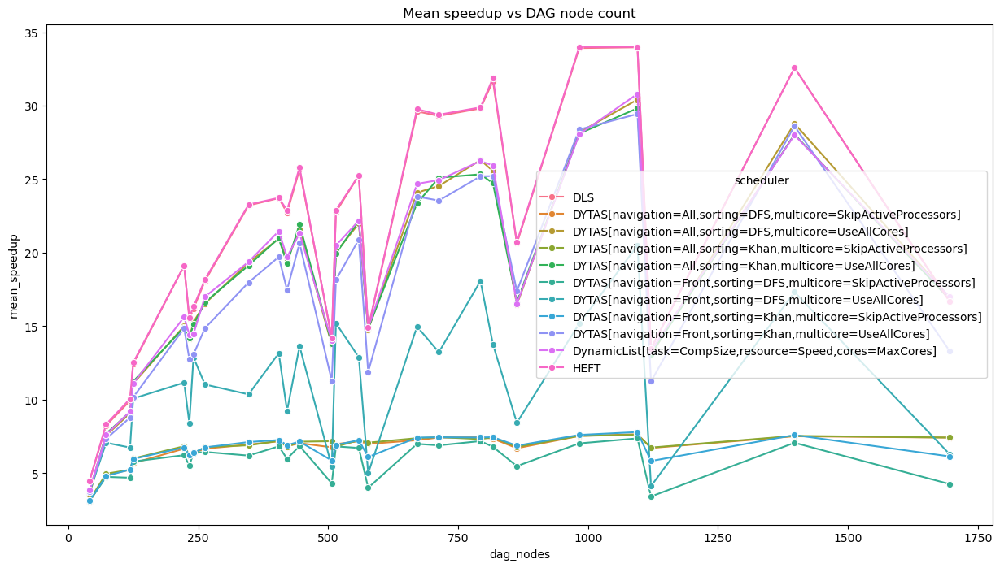

montage


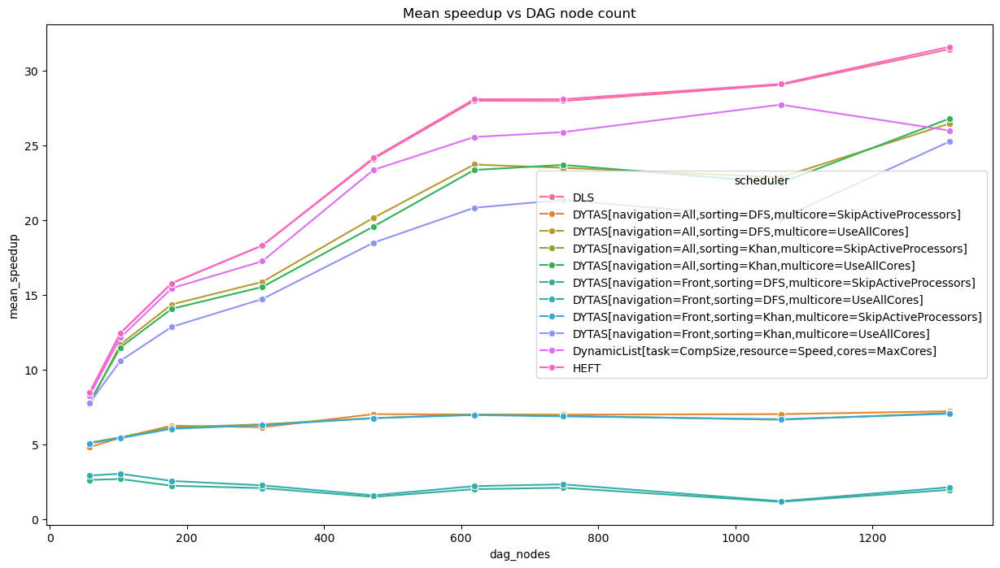

seismology


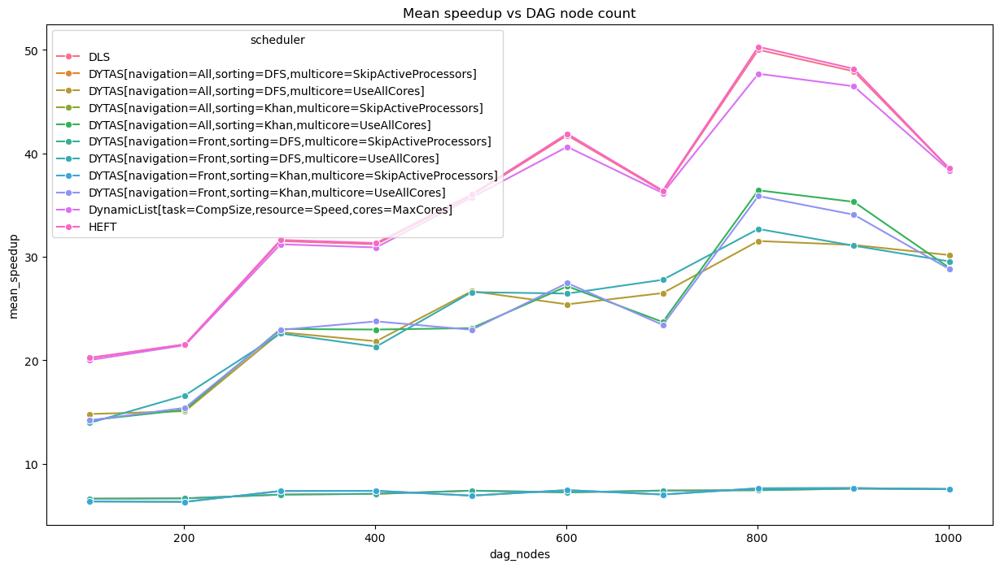

soykb


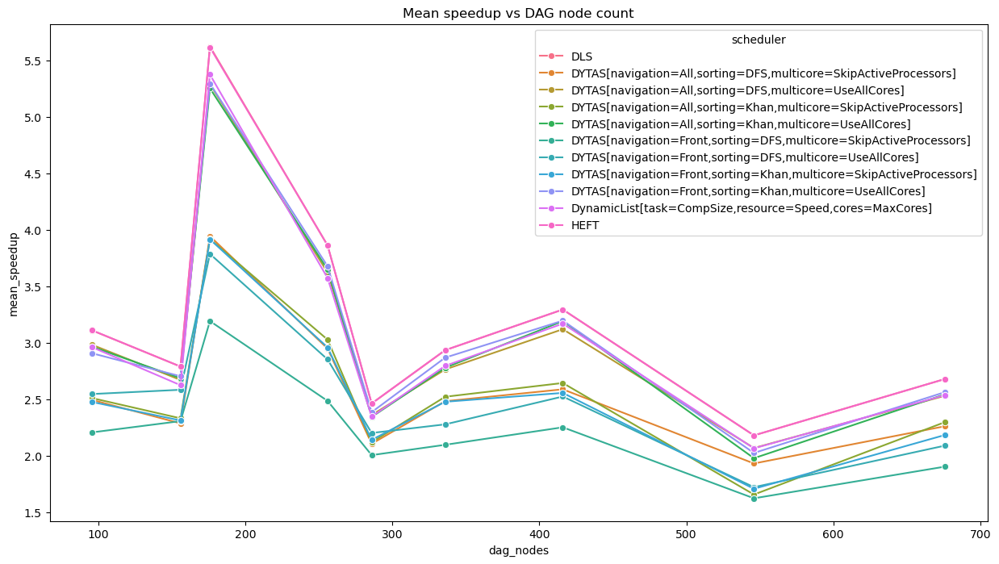

srasearch


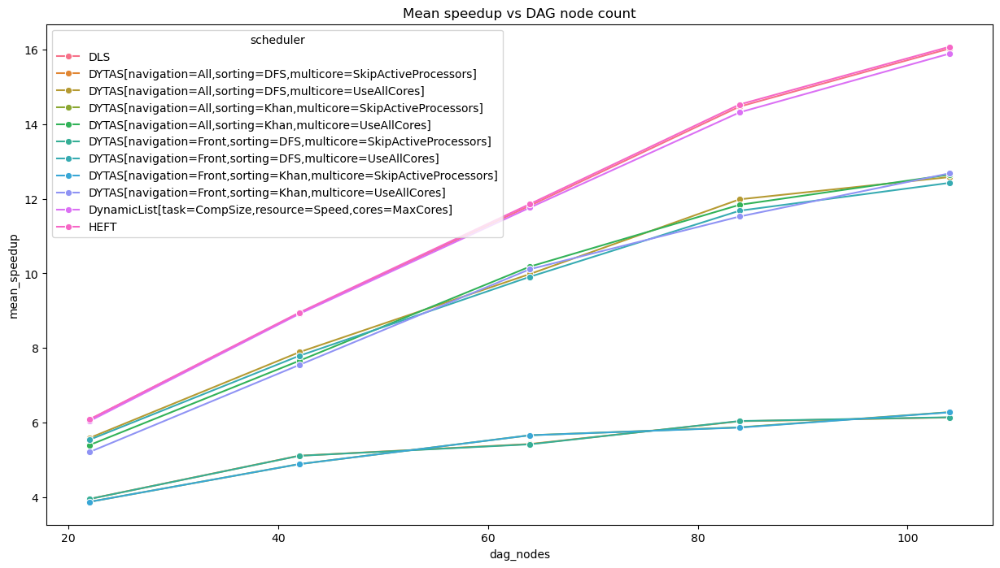

In [67]:
for workflow in df.workflow.unique():
    print(workflow)
    plot_mean_speedup(df[df.workflow == workflow])

In [68]:
df.columns

Index(['dag', 'system', 'scheduler', 'completed', 'makespan', 'exec_time',
       'run_stats.scheduling_time', 'run_stats.total_task_time',
       'run_stats.total_network_traffic', 'run_stats.total_network_time',
       'run_stats.max_used_cores', 'run_stats.max_used_memory',
       'run_stats.max_cpu_utilization', 'run_stats.max_memory_utilization',
       'run_stats.cpu_utilization', 'run_stats.memory_utilization',
       'run_stats.used_resource_count', 'run_stats.cpu_utilization_used',
       'run_stats.memory_utilization_used', 'run_stats.cpu_utilization_active',
       'run_stats.memory_utilization_active', 'run_stats.expected_makespan',
       'dag_path', 'system_path', 'dag_nodes', 'dag_edges', 'dag_density',
       'speedup', 'processor_count', 'core_count', 'efficiency_processors',
       'efficiency_cores', 'network_bandwidth', 'network_latency',
       'network_model', 'SLR', 'workflow'],
      dtype='object')

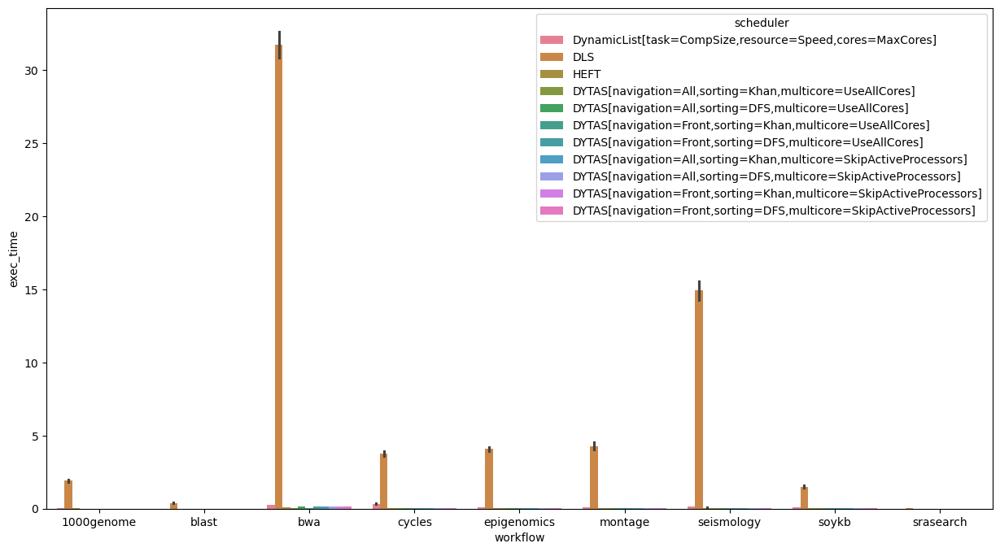

In [69]:
plt.figure(figsize=(15,8))

sns.barplot(data=df, x="workflow", y="exec_time", hue="scheduler")

plt.show()

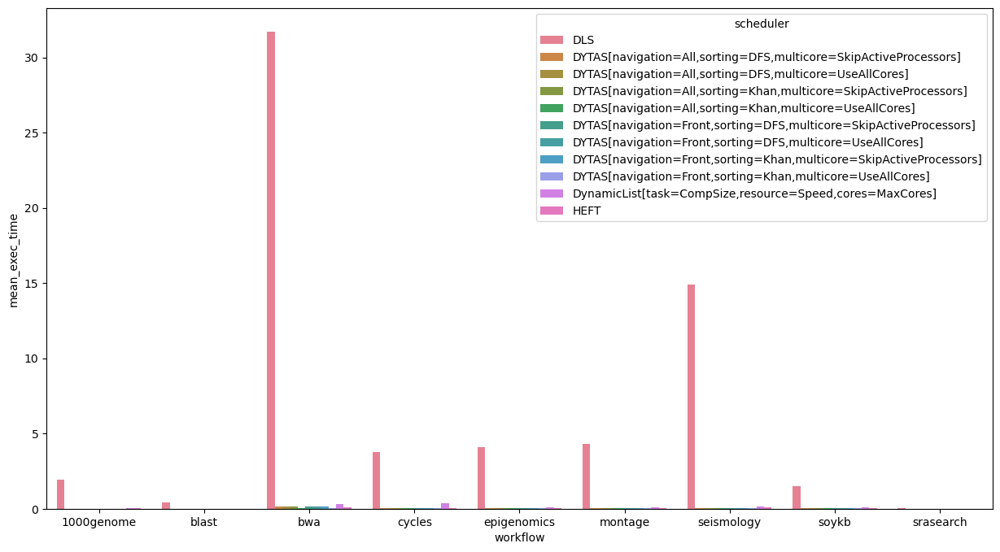

In [70]:
df_mean_workflow_exec_time = df[
    ["exec_time", "scheduler", "workflow"]
].groupby(["scheduler", "workflow"]).mean().reset_index()
df_mean_workflow_exec_time = df_mean_workflow_exec_time.rename(columns={"exec_time":"mean_exec_time"})

plt.figure(figsize=(15,8))

sns.barplot(data=df_mean_workflow_exec_time, x="workflow", y="mean_exec_time", hue="scheduler")

plt.show()

Given `DLS` is such an outlier in the above graph, and below it is easier to see all  other results with the clear assumption that `DLS` has the worst running time, followed by a large amount by `DynamicList`.

It's important to now that the below graph will depend heavily on 

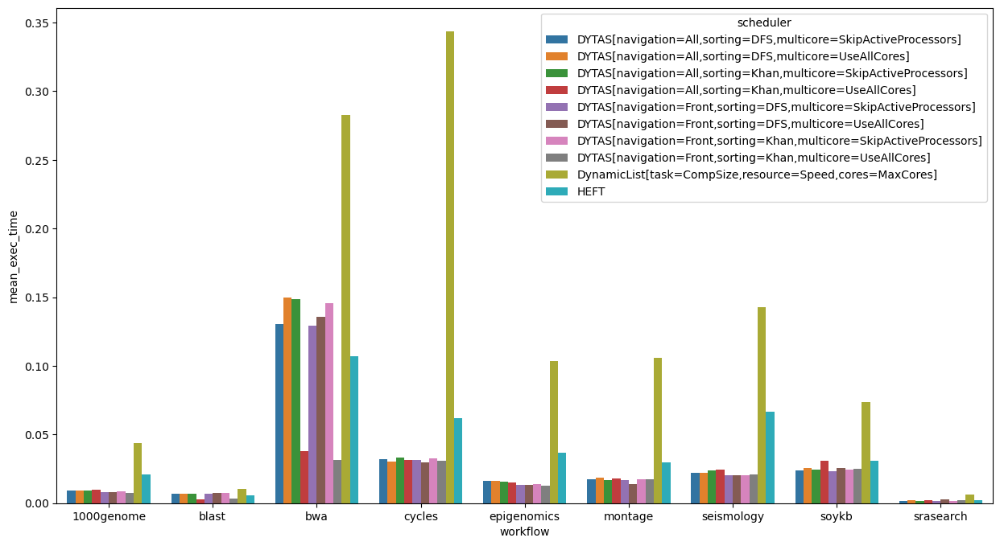

In [71]:
df_mean_workflow_exec_time = df[
    ["exec_time", "scheduler", "workflow"]
].groupby(["scheduler", "workflow"]).mean().reset_index()
df_mean_workflow_exec_time = df_mean_workflow_exec_time.rename(columns={"exec_time":"mean_exec_time"})

plt.figure(figsize=(15,8))

sns.barplot(data=df_mean_workflow_exec_time[df_mean_workflow_exec_time.scheduler != "DLS"], x="workflow", y="mean_exec_time", hue="scheduler")

plt.show()

# Calculating the Communication-to-Computation Ratio (CCR)

$$
\text{CCR} = \frac{\sum_{e \in E} c(e)}{\sum_{v \in V} w(v)}
$$

Where the numerator is the total data transfer time and the denominator is the total task computation time, for the workflow or DAG.

In [72]:
df.columns

Index(['dag', 'system', 'scheduler', 'completed', 'makespan', 'exec_time',
       'run_stats.scheduling_time', 'run_stats.total_task_time',
       'run_stats.total_network_traffic', 'run_stats.total_network_time',
       'run_stats.max_used_cores', 'run_stats.max_used_memory',
       'run_stats.max_cpu_utilization', 'run_stats.max_memory_utilization',
       'run_stats.cpu_utilization', 'run_stats.memory_utilization',
       'run_stats.used_resource_count', 'run_stats.cpu_utilization_used',
       'run_stats.memory_utilization_used', 'run_stats.cpu_utilization_active',
       'run_stats.memory_utilization_active', 'run_stats.expected_makespan',
       'dag_path', 'system_path', 'dag_nodes', 'dag_edges', 'dag_density',
       'speedup', 'processor_count', 'core_count', 'efficiency_processors',
       'efficiency_cores', 'network_bandwidth', 'network_latency',
       'network_model', 'SLR', 'workflow'],
      dtype='object')

In [73]:
df["run_stats.total_network_time"]

0         892.481093
1         892.570283
2         893.462183
3          89.257028
4          89.346218
             ...    
527467    147.190401
527468    147.512601
527469     11.938948
527470     11.974498
527471     12.329998
Name: run_stats.total_network_time, Length: 527472, dtype: float64

In [74]:
df["run_stats.total_task_time"]

0          4870.725405
1          4870.725405
2          4870.725405
3          4870.725405
4          4870.725405
              ...     
527467    37701.250710
527468    37701.250710
527469    37701.250710
527470    37701.250710
527471    37701.250710
Name: run_stats.total_task_time, Length: 527472, dtype: float64

In [75]:
df["CCR"] = df["run_stats.total_network_time"] / df["run_stats.total_task_time"]

<Axes: ylabel='CCR'>

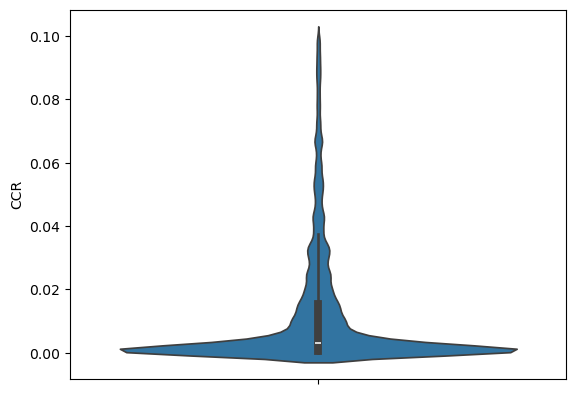

In [76]:
sns.violinplot(df[df.CCR < 0.1]["CCR"])

In [77]:
df.CCR.max()

94617.23715041442

In [78]:
df.CCR.min()

2.8304463158820398e-09

In [79]:
df.CCR.median()

0.011565767584732626

In [80]:
def plot_avg_slr_vs_ccr(df, n_bins):
    
    # Automatically calculate bins based on min/max CCR
    min_val = df['CCR'].min()
    max_val = df['CCR'].max()
    bins = np.linspace(min_val, max_val, n_bins + 1)
    
    # Create readable labels for the bins
    labels = [f'{(bins[i] + bins[i+1])/2:.1f}' for i in range(len(bins)-1)]

    df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)

    df_mean_slr = df[
    ["SLR", "scheduler", "CCR_bin"]
    ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()
    df_mean_slr = df_mean_slr.rename(columns={"SLR":"mean_SLR"})
    
    plt.figure(figsize=(15,8))
    
    sns.barplot(data=df_mean_slr, x="CCR_bin", y="mean_SLR", hue="scheduler")
    
    plt.show()

1000genome


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


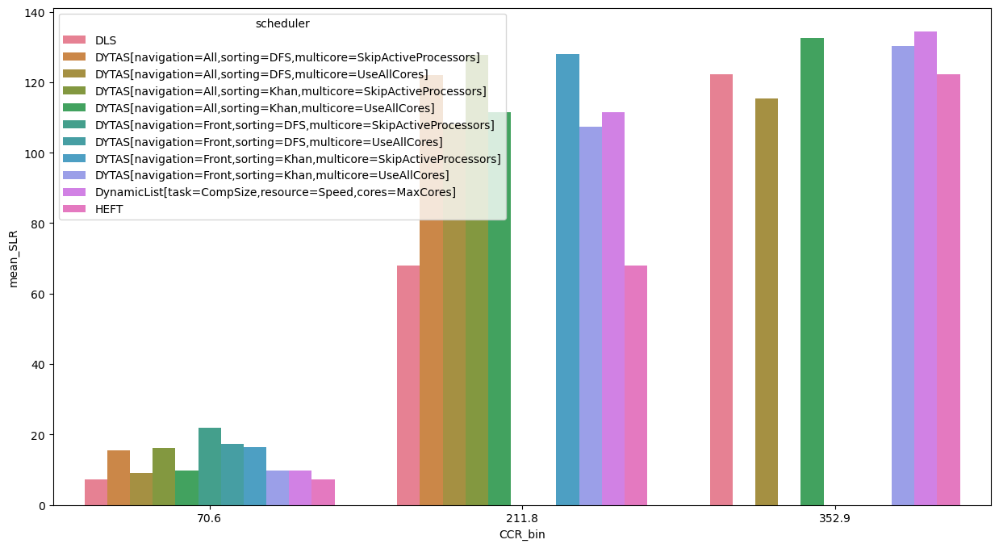

blast


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


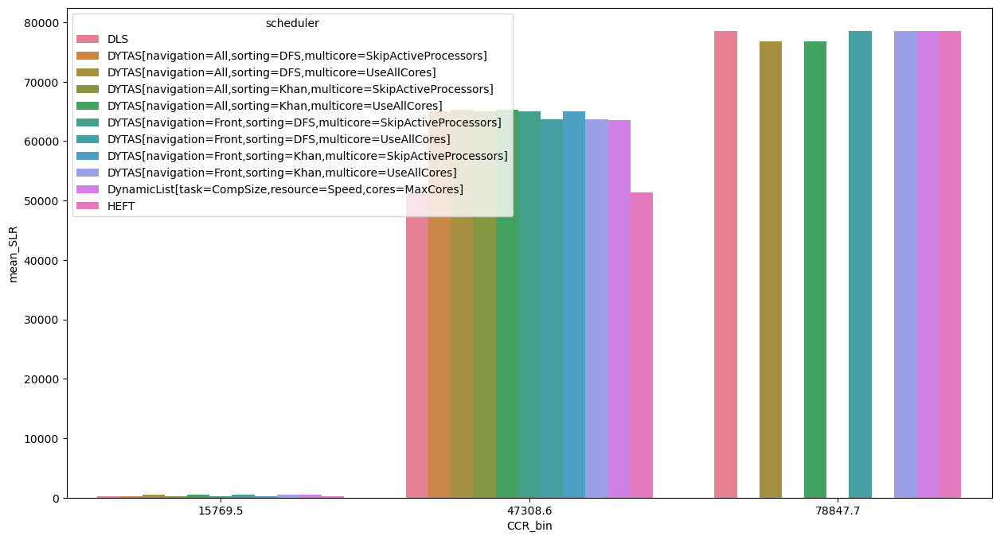

bwa


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


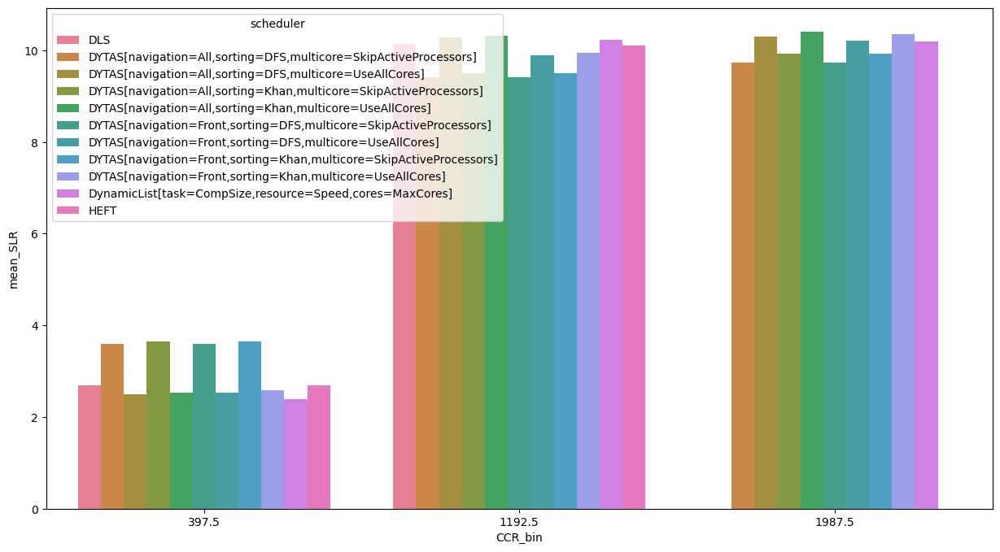

cycles


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


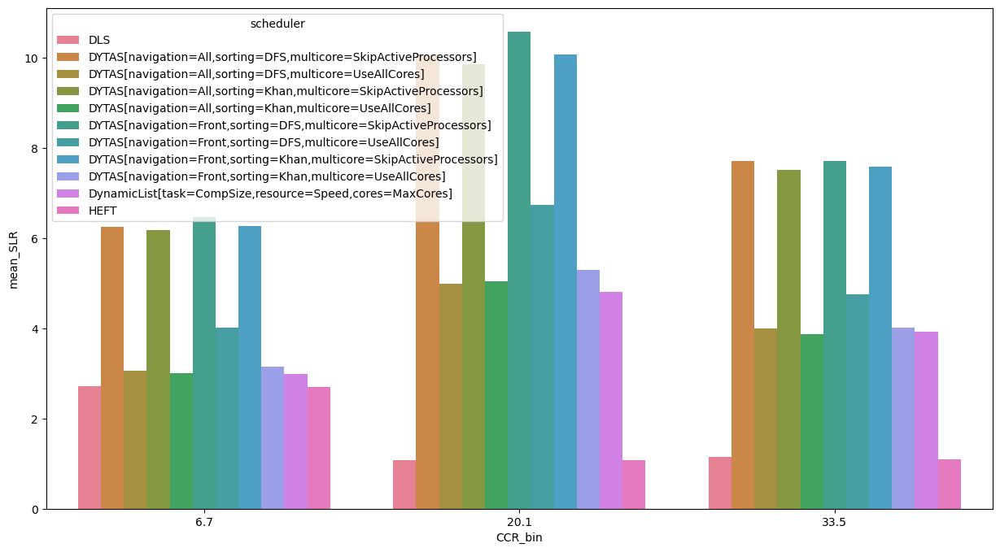

epigenomics


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


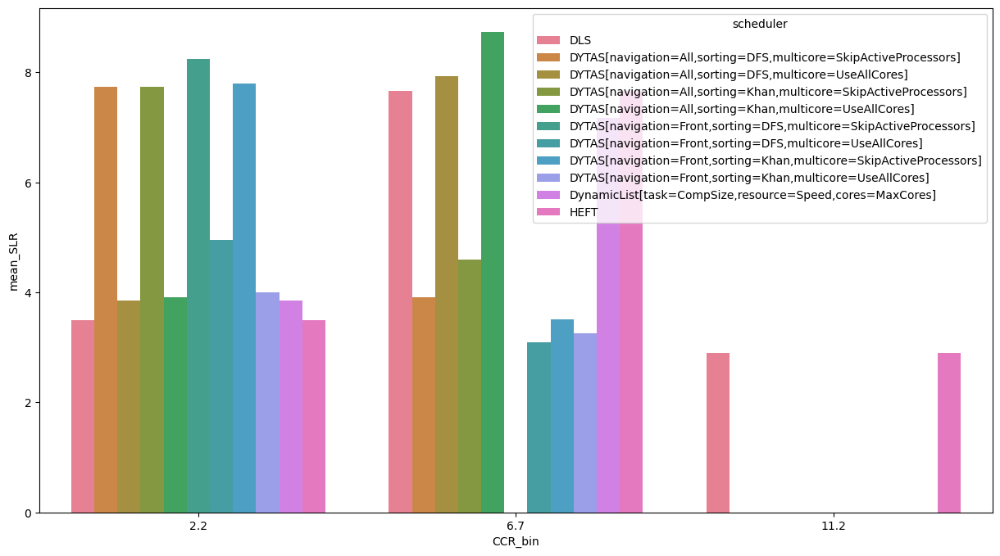

montage


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


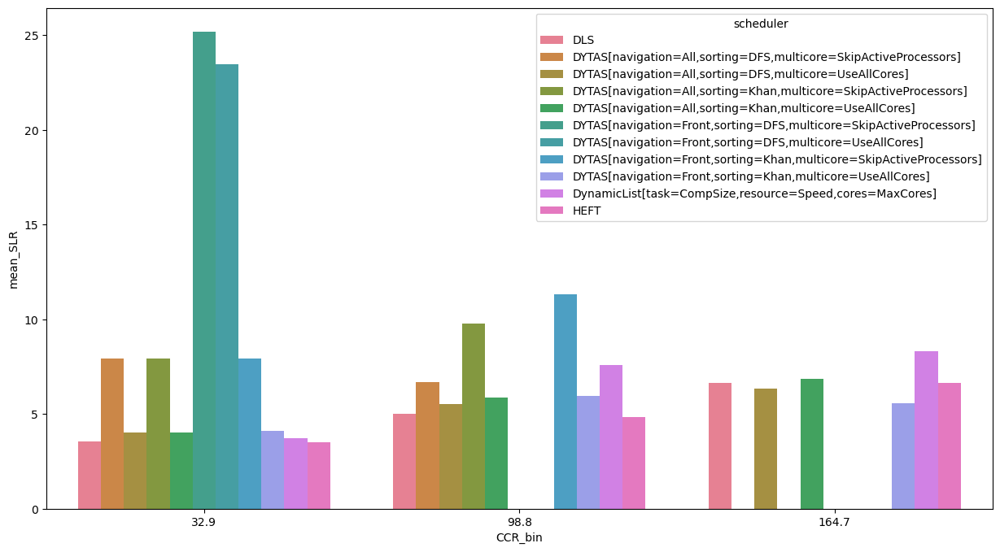

seismology


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


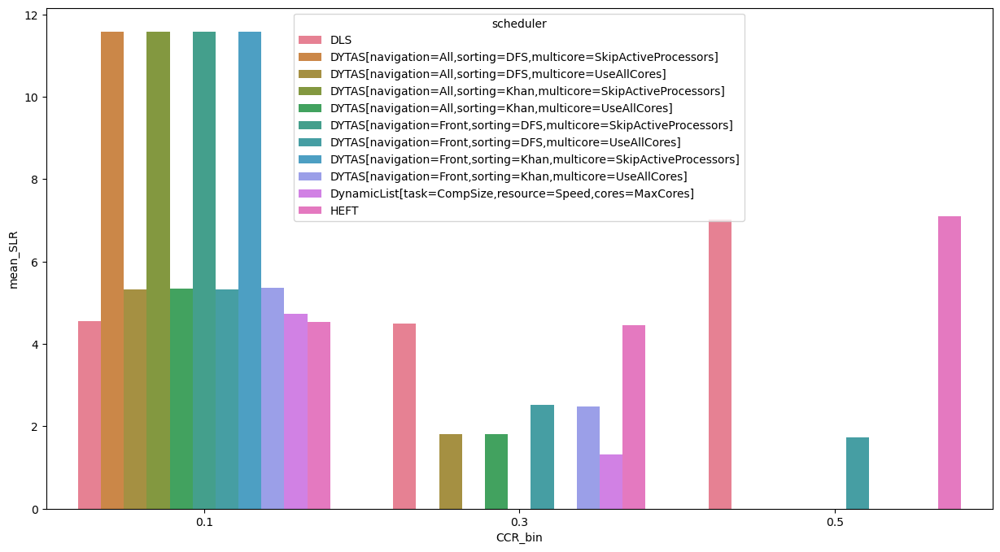

soykb


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


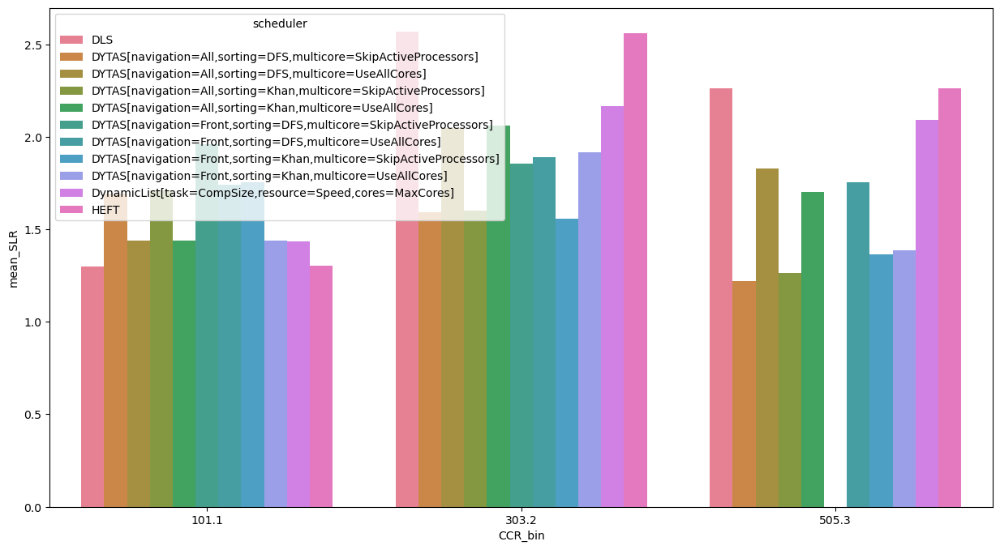

srasearch


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


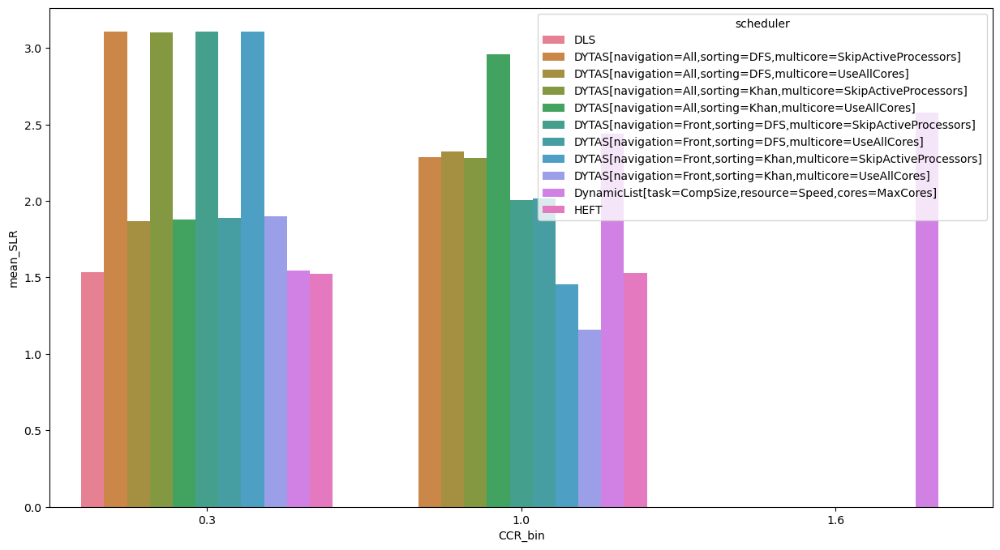

In [81]:
for workflow in df.workflow.unique():
    print(workflow)
    plot_avg_slr_vs_ccr(df[df.workflow == workflow], 3)

In [82]:
def plot_avg_exec_time_vs_ccr(df, n_bins):
    
    # Automatically calculate bins based on min/max CCR
    min_val = df['CCR'].min()
    max_val = df['CCR'].max()
    bins = np.linspace(min_val, max_val, n_bins + 1)
    
    # Create readable labels for the bins
    labels = [f'{(bins[i] + bins[i+1])/2:.1f}' for i in range(len(bins)-1)]

    df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)

    df_mean_exec_time = df[
    ["exec_time", "scheduler", "CCR_bin"]
    ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()
    df_mean_exec_time = df_mean_exec_time.rename(columns={"exec_time":"mean_exec_time"})
    
    plt.figure(figsize=(15,8))
    
    sns.barplot(data=df_mean_exec_time, x="CCR_bin", y="mean_exec_time", hue="scheduler")
    
    plt.show()

1000genome


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


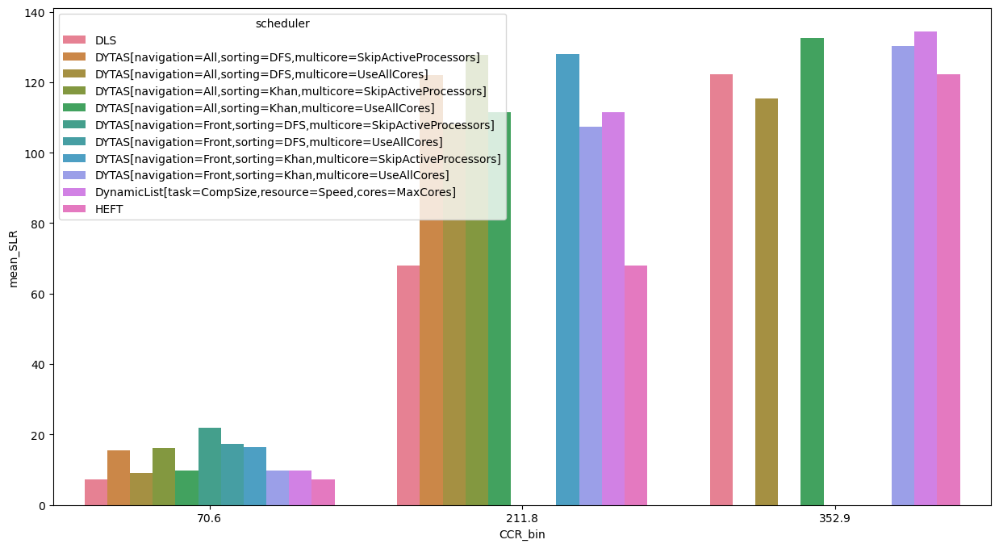

blast


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


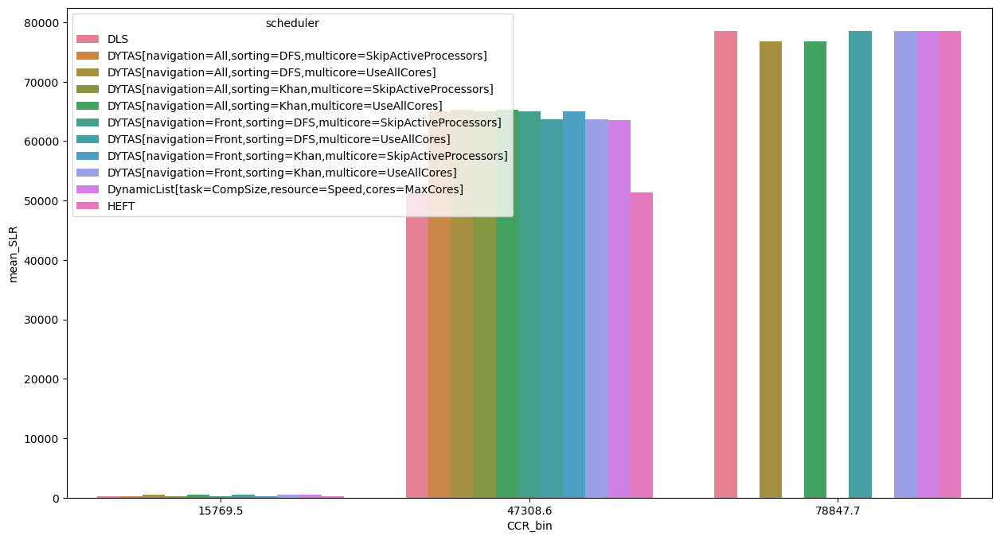

bwa


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


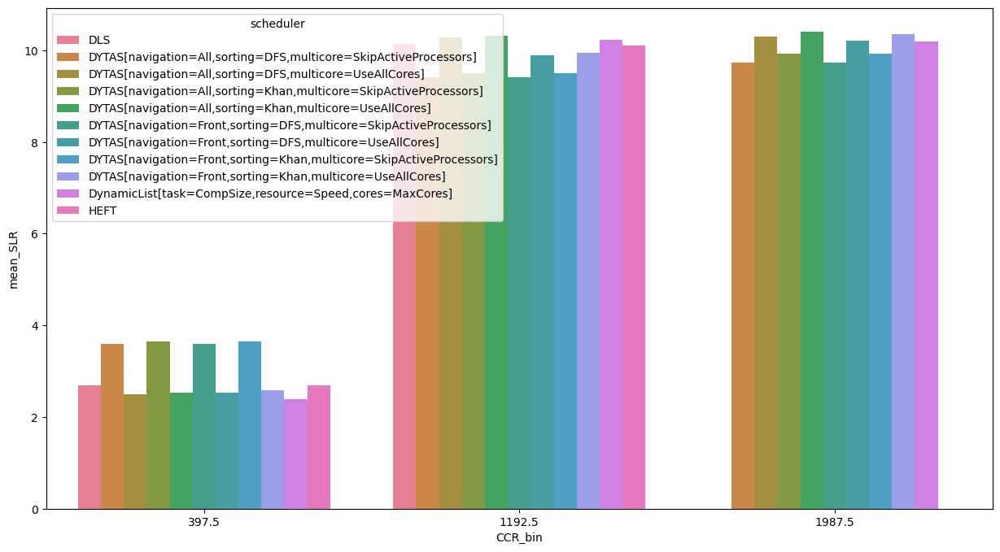

cycles


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


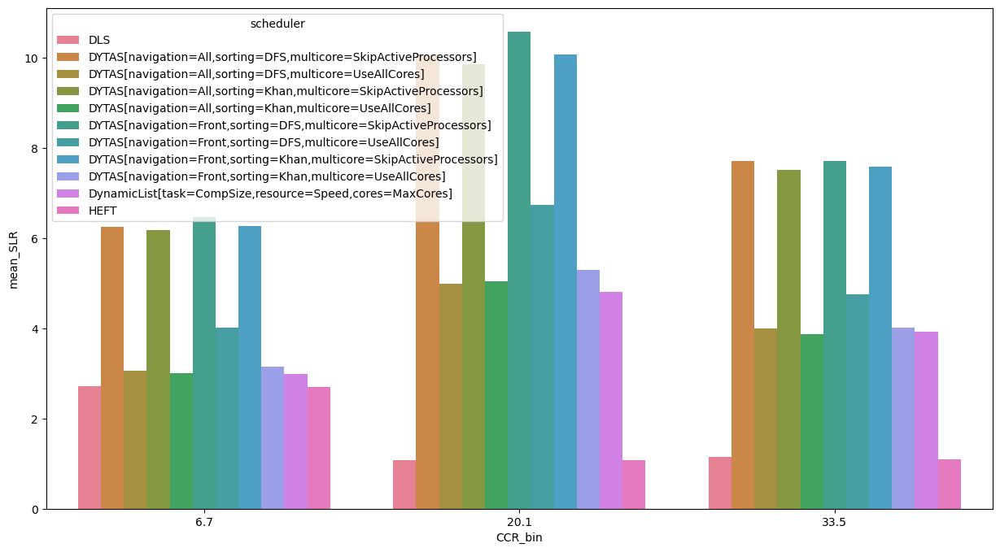

epigenomics


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


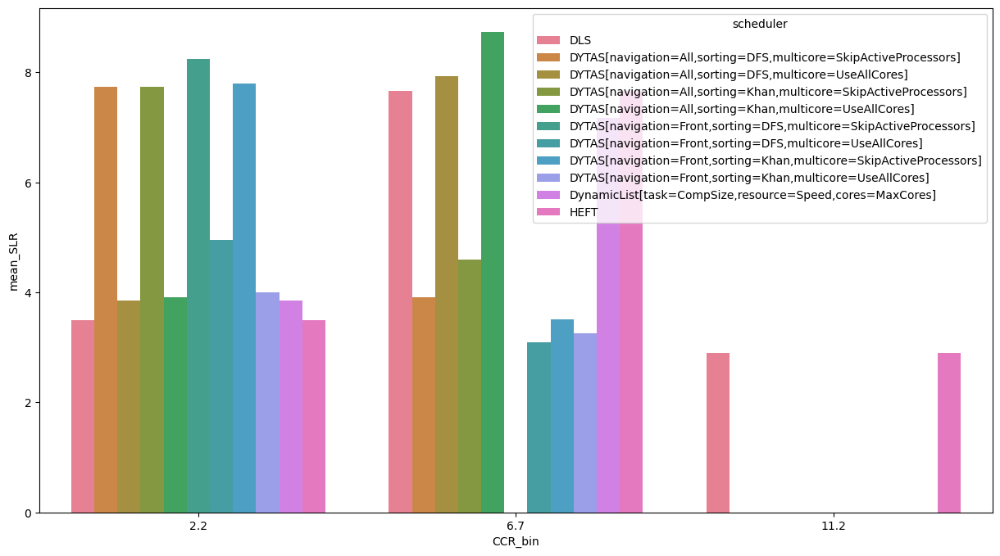

montage


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


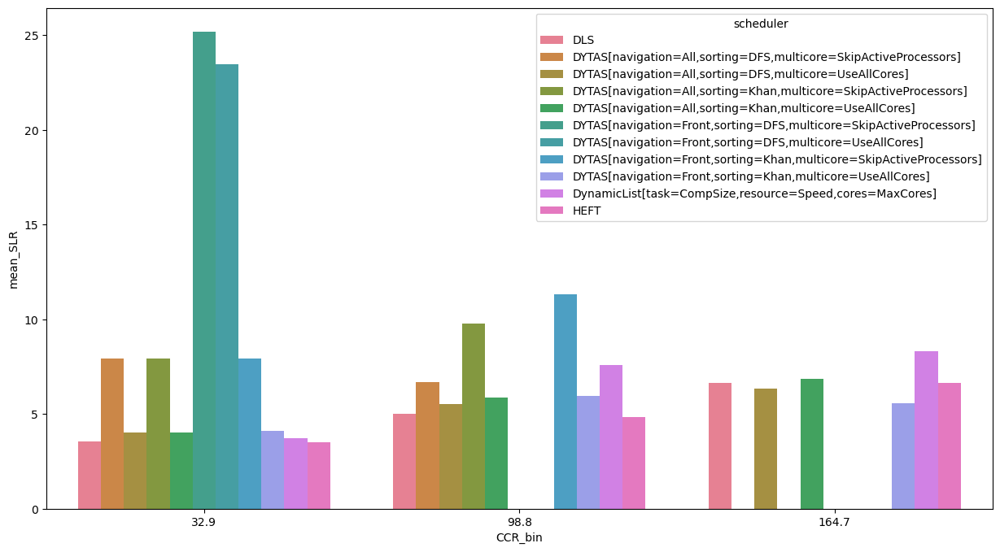

seismology


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


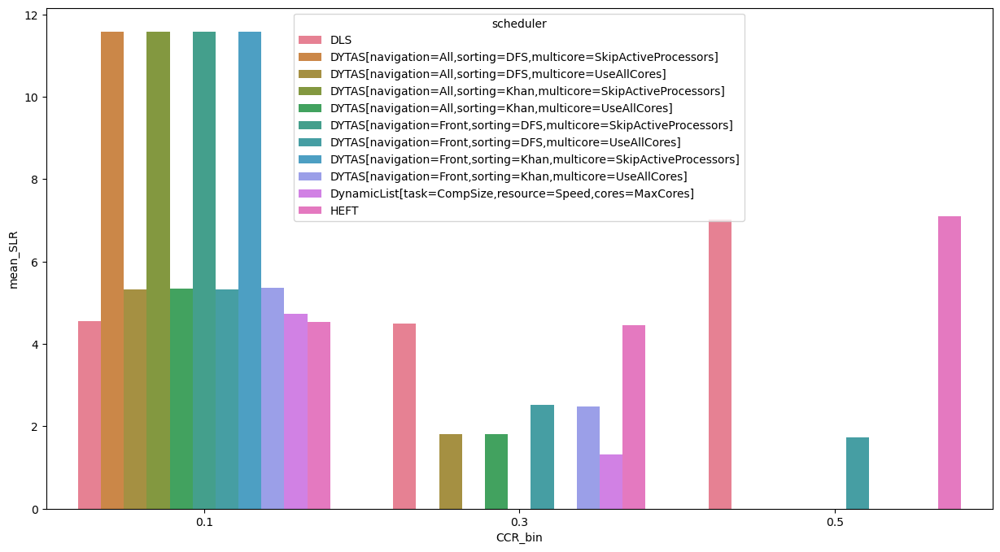

soykb


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


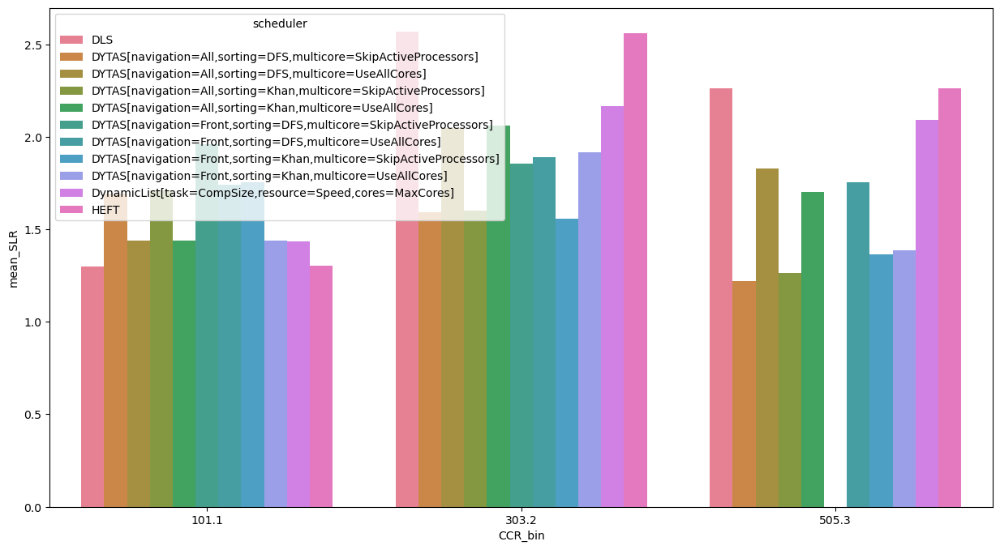

srasearch


/tmp/ipykernel_17091/1734636295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CCR_bin'] = pd.cut(df['CCR'], bins=bins, labels=labels, include_lowest=True)
/tmp/ipykernel_17091/1734636295.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ].groupby(["scheduler", "CCR_bin"]).mean().reset_index()


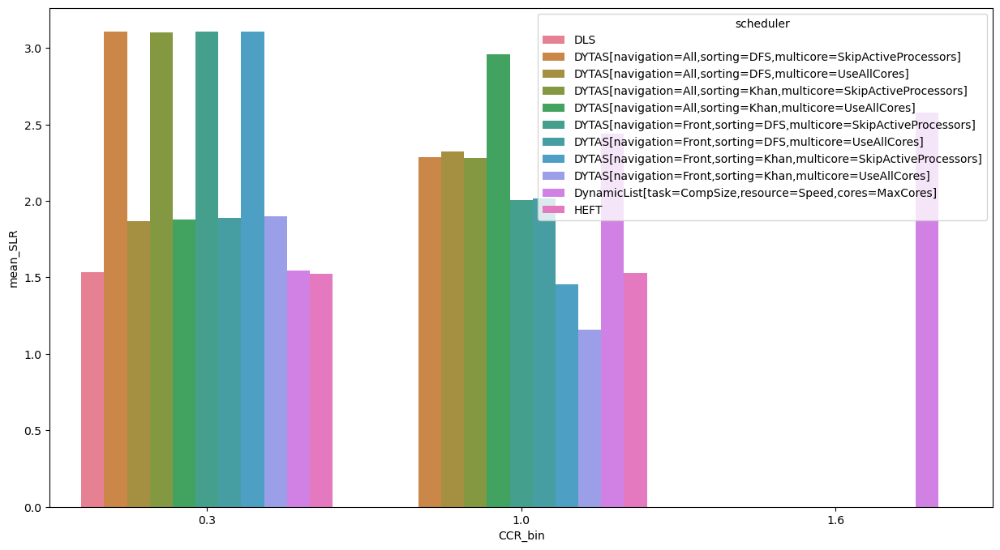

In [83]:
for workflow in df.workflow.unique():
    print(workflow)
    plot_avg_slr_vs_ccr(df[df.workflow == workflow], 3)

# Making a pairwise comparison of SLR performance

In [84]:
# First, creating a test_id for each test instance.
# These will be (system, dag) pairs.

df["test_id"] = df["system"].astype(str) + "_" + df["dag"].astype(str)

In [85]:
df["test_id"].nunique()

47952

In [87]:
from itertools import combinations
from collections import defaultdict
import choix
from collections import Counter

def calculate_pairwise_comparison(df, metric, invert_comparison = False):
    """
    This will calculate a pairwuse comparison of each test instance
    to see how much better each algorithm is against another on
    the specified metric.

    By default, smaller values are considered "better," but by
    enabling invert_comparison, higher values are considered "better".
    """
    comparison_stats = defaultdict(lambda: {'B': 0, 'E': 0, 'W': 0})

    # Group once by test id
    for _, group in df.groupby('test_id'):
        # Turn group into a dict: {'HLFET': 500, 'MCP': 480, ...}
        perf = dict(zip(group['scheduler'], group[metric]))
        
        # Only compare algorithms that are present in this test instance
        algos_in_test = list(perf.keys())
    
        # Do pairwise comparisons
        for algo1, algo2 in combinations(algos_in_test, 2):
            m1, m2 = perf[algo1], perf[algo2]

            large_lbl = "W" if not invert_comparison else "B"
            small_lbl = "B" if not invert_comparison else "W"
            
            if m1 < m2:
                comparison_stats[(algo1, algo2)][small_lbl] += 1
                comparison_stats[(algo2, algo1)][large_lbl] += 1
            elif m1 > m2:
                comparison_stats[(algo1, algo2)][large_lbl] += 1
                comparison_stats[(algo2, algo1)][small_lbl] += 1
            else:
                comparison_stats[(algo1, algo2)]['E'] += 1
                comparison_stats[(algo2, algo1)]['E'] += 1

    
    # Number of tests
    n_tests = df['test_id'].nunique()
    
    # Turn results into percentages
    for key in comparison_stats:
        for result in ['B', 'E', 'W']:
            comparison_stats[key][result] = 100 * comparison_stats[key][result] / n_tests

    
    return comparison_stats


def rank_pairwise_comparison(comparison_stats):
    # Initialize win rates
    win_rate = defaultdict(float)

    algorithms = []
    
    # Count B (better) percentages against all other algorithms
    for (row_alg, col_alg), results in comparison_stats.items():
        win_rate[row_alg] += results['B']
        if row_alg not in algorithms:
            algorithms.append(row_alg)
    
    # Normalize by number of opponents
    n_opponents = len(set(algorithms)) - 1
    for alg in win_rate:
        win_rate[alg] /= n_opponents

    ranking_df = pd.DataFrame.from_dict(win_rate, orient='index', columns=['Average Win Rate (%)'])
    ranking_df.sort_values('Average Win Rate (%)', ascending=False, inplace=True)

    return ranking_df


def bradley_terry_model(comparison_stats):
    # Count total number of "wins" between pairs
    pairwise_counts = Counter()
    
    for (a1, a2), result in comparison_stats.items():
        wins = round(result['B'])  # convert % to approx win count
        if wins > 0:
            pairwise_counts[(a1, a2)] += wins

    # Map algorithms to indices
    algorithms = sorted({a for pair in pairwise_counts.keys() for a in pair})
    algo_to_idx = {a: i for i, a in enumerate(algorithms)}
    idx_to_algo = {i: a for a, i in algo_to_idx.items()}
    
    # Convert to pair list
    pairwise_list = []
    for (winner, loser), count in pairwise_counts.items():
        winner_idx = algo_to_idx[winner]
        loser_idx = algo_to_idx[loser]
        pairwise_list.extend([(winner_idx, loser_idx)] * count)


    # Fit scores using MLE
    bt_scores = choix.ilsr_pairwise(n_items=len(algorithms), data=pairwise_list)

    bt_df = pd.DataFrame({
    'Algorithm': [idx_to_algo[i] for i in range(len(algorithms))],
    'BT Score': bt_scores
    }).sort_values('BT Score', ascending=False).reset_index(drop=True)
    
    return bt_df

In [88]:
calculate_pairwise_comparison(df, "speedup", True)

defaultdict(<function __main__.calculate_pairwise_comparison.<locals>.<lambda>()>,
            {('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]',
              'DLS'): {'B': 12.698114781448115,
              'E': 0.5630630630630631,
              'W': 86.73882215548882},
             ('DLS',
              'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 86.73882215548882,
              'E': 0.5630630630630631,
              'W': 12.698114781448115},
             ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]',
              'HEFT'): {'B': 11.34884884884885,
              'E': 0.5630630630630631,
              'W': 88.08808808808809},
             ('HEFT',
              'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 88.08808808808809,
              'E': 0.5630630630630631,
              'W': 11.34884884884885},
             ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]',
              'DYTAS[navigation=All,sorting

In [89]:
def calculate_comparison_on_all_metrics(df):
    metrics = [
        ("makespan", False),
        ("SLR", False),
        ("exec_time", False),
        ("efficiency_cores", True),
        ("efficiency_processors", True),
        ("speedup", True)
    ]
    bt_scores = {}
    comparison_stats_scores = {}
    
    
    for _, (metric, invert_comparison) in enumerate(metrics):
        comparison_stats = calculate_pairwise_comparison(df, metric, invert_comparison)
        comparison_stats_scores[metric] = comparison_stats
        print(comparison_stats)
        bt_df = bradley_terry_model(comparison_stats)
        bt_scores[metric] = bt_df
        print(metric)
    
        # Bar plots
        plt.figure(figsize=(15,8))
        sns.barplot(bt_df, y="BT Score", hue="Algorithm")
        plt.show()
    
        # Table
    
        index_tuples = []
        table_data = []
    
        algorithms = bt_df.Algorithm.unique()
        
        # Build multi-index rows: for each algorithm, create rows for B, E, W
        for row_alg in algorithms:
            for metric in ['B', 'E', 'W']:
                index_tuples.append((row_alg, metric))
                row = []
                for col_alg in algorithms:
                    if row_alg == col_alg:
                        row.append("")  # leave diagonal empty
                    else:
                        value = comparison_stats.get((row_alg, col_alg), {}).get(metric, None)
                        row.append(f"{value:.2f}%" if value is not None else "")
                table_data.append(row)
        
        # Create a MultiIndex DataFrame
        index = pd.MultiIndex.from_tuples(index_tuples, names=["Algorithm", "Result"])
        comparison_df = pd.DataFrame(table_data, index=index, columns=algorithms)
    
        display(comparison_df)

    return (bt_scores, comparison_stats_scores)
    

In [90]:
# from IPython.display import display

# metrics = [
#     ("makespan", False), ("SLR", False),
#     ("exec_time", False),
#     ("efficiency_cores", True),
#     ("efficiency_processors", True),
#     ("speedup", True)
# ]

# bt_scores = {}
# comparison_stats_scores = {}


# for _, (metric, invert_comparison) in enumerate(metrics):
#     comparison_stats = calculate_pairwise_comparison(df, metric, invert_comparison)
#     comparison_stats_scores[metric] = comparison_stats
#     bt_df = bradley_terry_model(comparison_stats)
#     bt_scores[metric] = bt_df
#     print(metric)

#     # Bar plots
#     plt.figure(figsize=(15,8))
#     sns.barplot(bt_df, y="BT Score", hue="Algorithm")
#     plt.show()

#     # Table

#     index_tuples = []
#     table_data = []

#     algorithms = bt_df.Algorithm.unique()
    
#     # Build multi-index rows: for each algorithm, create rows for B, E, W
#     for row_alg in algorithms:
#         for metric in ['B', 'E', 'W']:
#             index_tuples.append((row_alg, metric))
#             row = []
#             for col_alg in algorithms:
#                 if row_alg == col_alg:
#                     row.append("")  # leave diagonal empty
#                 else:
#                     value = comparison_stats.get((row_alg, col_alg), {}).get(metric, None)
#                     row.append(f"{value:.2f}%" if value is not None else "")
#             table_data.append(row)
    
#     # Create a MultiIndex DataFrame
#     index = pd.MultiIndex.from_tuples(index_tuples, names=["Algorithm", "Result"])
#     comparison_df = pd.DataFrame(table_data, index=index, columns=algorithms)

#     display(comparison_df)



defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fbb73734720>, {('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 12.698114781448115, 'E': 0.5630630630630631, 'W': 86.73882215548882}, ('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 86.73882215548882, 'E': 0.5630630630630631, 'W': 12.698114781448115}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'HEFT'): {'B': 11.34884884884885, 'E': 0.5630630630630631, 'W': 88.08808808808809}, ('HEFT', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 88.08808808808809, 'E': 0.5630630630630631, 'W': 11.34884884884885}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]'): {'B': 67.97839506172839, 'E': 1.334668001334668, 'W': 30.686936936936938}, ('DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 30.6

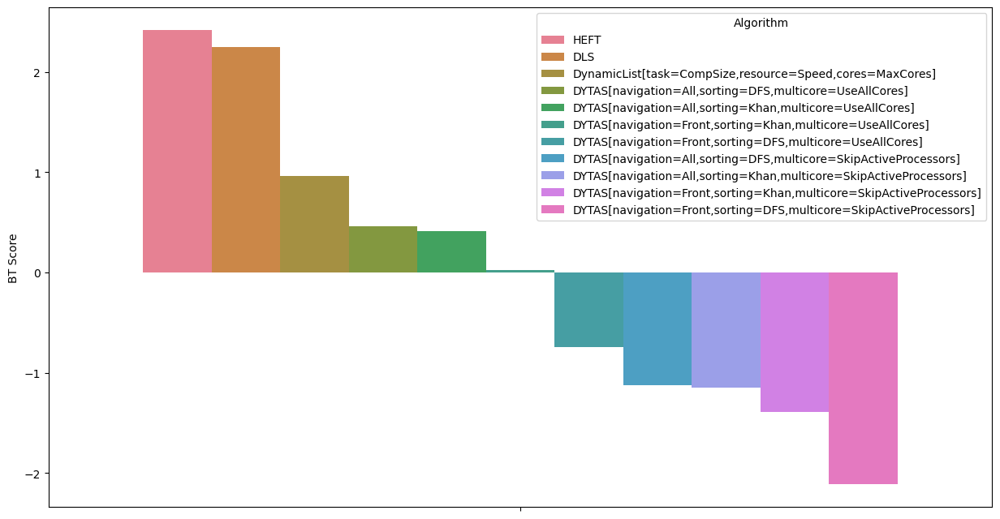

HEFT     DLS  \
Algorithm                                          Result                   
HEFT                                               B               26.73%   
                                                   E               58.67%   
                                                   W               14.60%   
DLS                                                B       14.60%           
                                                   E       58.67%           
                                                   W       26.73%           
DynamicList[task=CompSize,resource=Speed,cores=... B       11.35%  12.70%   
                                                   E        0.56%   0.56%   
                                                   W       88.09%  86.74%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B        9.55%   9.65%   
                                                   E        2.53%   2.53%   
                                                   W       87.92%  87.82%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B        7.97%   8.06%   
                                                   E        1.55%   1.55%   
                                                   W       90.48%  90.39%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B        6.78%   6.86%   
                                                   E        0.19%   0.19%   
                                                   W       93.03%  92.95%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B        5.57%   5.66%   
                                                   E        0.61%   0.61%   
                                                   W       93.82%  93.73%   
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B        7.29%   7.39%   
                                                   E        0.00%   0.00%   
                                                   W       92.71%  92.61%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B        6.51%   6.60%   
                                                   E        0.00%   0.00%   
                                                   W       93.49%  93.40%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B        6.31%   6.39%   
                                                   E        0.00%   0.00%   
                                                   W       93.69%  93.61%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B        5.68%   5.76%   
                                                   E        0.00%   0.00%   
                                                   W       94.32%  94.24%   

                                                          DynamicList[task=CompSize,resource=Speed,cores=MaxCores]  \
Algorithm                                          Result                                                            
HEFT                                               B                                                  88.09%         
                                                   E                                                   0.56%         
                                                   W                                                  11.35%         
DLS                                                B                                                  86.74%         
                                                   E                                                   0.56%         
                                                   W                                                  12.70%         
DynamicList[task=CompSize,resource=Speed,cores=... B                                                                 
                                                   E                                                                 
                                                   W                                                                 
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B               

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fbc30500720>, {('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 12.698114781448115, 'E': 0.5630630630630631, 'W': 86.73882215548882}, ('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 86.73882215548882, 'E': 0.5630630630630631, 'W': 12.698114781448115}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'HEFT'): {'B': 11.34884884884885, 'E': 0.5630630630630631, 'W': 88.08808808808809}, ('HEFT', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 88.08808808808809, 'E': 0.5630630630630631, 'W': 11.34884884884885}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]'): {'B': 67.97839506172839, 'E': 1.334668001334668, 'W': 30.686936936936938}, ('DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 30.6

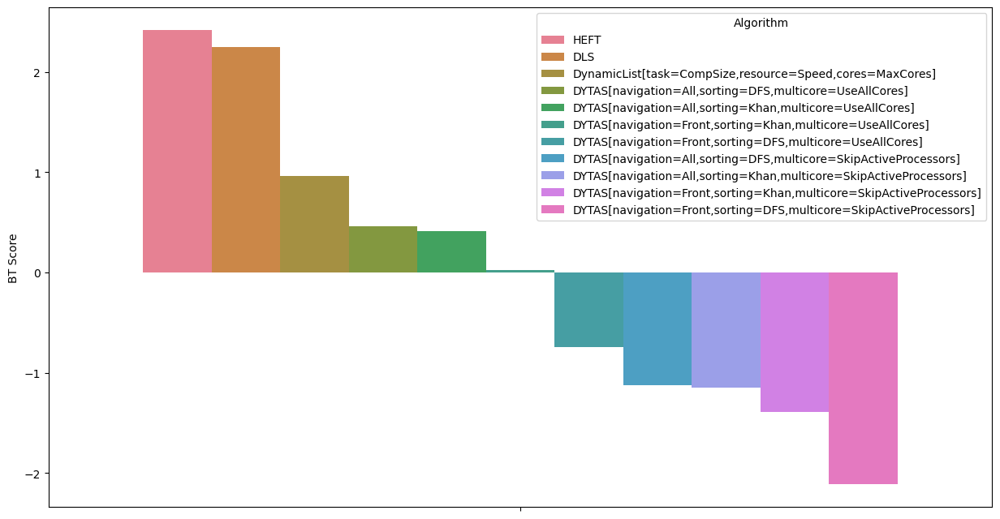

HEFT     DLS  \
Algorithm                                          Result                   
HEFT                                               B               26.73%   
                                                   E               58.67%   
                                                   W               14.60%   
DLS                                                B       14.60%           
                                                   E       58.67%           
                                                   W       26.73%           
DynamicList[task=CompSize,resource=Speed,cores=... B       11.35%  12.70%   
                                                   E        0.56%   0.56%   
                                                   W       88.09%  86.74%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B        9.55%   9.65%   
                                                   E        2.53%   2.53%   
                                                   W       87.92%  87.82%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B        7.97%   8.06%   
                                                   E        1.55%   1.55%   
                                                   W       90.48%  90.39%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B        6.78%   6.86%   
                                                   E        0.19%   0.19%   
                                                   W       93.03%  92.95%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B        5.57%   5.66%   
                                                   E        0.61%   0.61%   
                                                   W       93.82%  93.73%   
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B        7.29%   7.39%   
                                                   E        0.00%   0.00%   
                                                   W       92.71%  92.61%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B        6.51%   6.60%   
                                                   E        0.00%   0.00%   
                                                   W       93.49%  93.40%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B        6.31%   6.39%   
                                                   E        0.00%   0.00%   
                                                   W       93.69%  93.61%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B        5.68%   5.76%   
                                                   E        0.00%   0.00%   
                                                   W       94.32%  94.24%   

                                                          DynamicList[task=CompSize,resource=Speed,cores=MaxCores]  \
Algorithm                                          Result                                                            
HEFT                                               B                                                  88.09%         
                                                   E                                                   0.56%         
                                                   W                                                  11.35%         
DLS                                                B                                                  86.74%         
                                                   E                                                   0.56%         
                                                   W                                                  12.70%         
DynamicList[task=CompSize,resource=Speed,cores=... B                                                                 
                                                   E                                                                 
                                                   W                                                                 
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B               

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fbc20102340>, {('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 97.05121788455122, 'E': 0.0, 'W': 2.948782115448782}, ('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 2.948782115448782, 'E': 0.0, 'W': 97.05121788455122}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'HEFT'): {'B': 5.23023023023023, 'E': 0.0, 'W': 94.76976976976977}, ('HEFT', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 94.76976976976977, 'E': 0.0, 'W': 5.23023023023023}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]'): {'B': 2.350266933600267, 'E': 0.0, 'W': 97.64973306639973}, ('DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 97.64973306639973, 'E': 0.0, 'W': 2.350266933600267}, ('DynamicList[task=CompSize,r

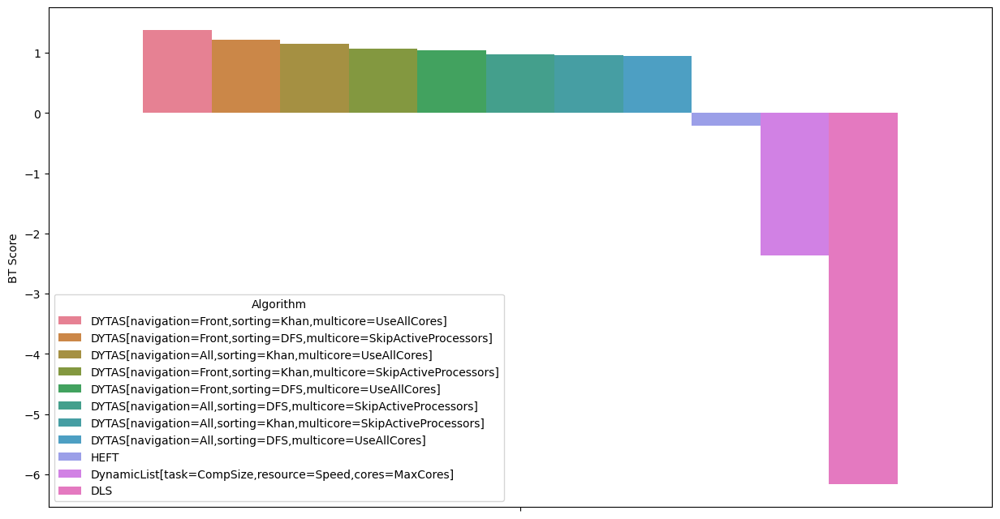

DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]  \
Algorithm                                          Result                                                              
DYTAS[navigation=Front,sorting=Khan,multicore=U... B                                                                   
                                                   E                                                                   
                                                   W                                                                   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B                                                  46.06%           
                                                   E                                                   0.00%           
                                                   W                                                  53.94%           
DYTAS[navigation=All,sorting=Khan,multicore=Use... B                                                  44.29%           
                                                   E                                                   0.00%           
                                                   W                                                  55.71%           
DYTAS[navigation=Front,sorting=Khan,multicore=S... B                                                  42.14%           
                                                   E                                                   0.00%           
                                                   W                                                  57.86%           
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B                                                  41.85%           
                                                   E                                                   0.00%           
                                                   W                                                  58.15%           
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B                                                  40.18%           
                                                   E                                                   0.00%           
                                                   W                                                  59.82%           
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B                                                  40.13%           
                                                   E                                                   0.00%           
                                                   W                                                  59.87%           
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B                                                  40.27%           
                                                   E                                                   0.00%           
                                                   W                                                  59.73%           
HEFT                                               B                                                  17.08%           
                                                   E                                                   0.00%           
                                                   W                                                  82.92%           
DynamicList[task=CompSize,resource=Speed,cores=... B                                                   1.99%           
                                                   E                                                   0.00%           
                                                   W                                                  98.01%           
DLS                                                B                                                   0.13%           
                                                   E                                              

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fbb7ac45120>, {('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 12.698114781448115, 'E': 0.5630630630630631, 'W': 86.73882215548882}, ('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 86.73882215548882, 'E': 0.5630630630630631, 'W': 12.698114781448115}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'HEFT'): {'B': 11.34884884884885, 'E': 0.5630630630630631, 'W': 88.08808808808809}, ('HEFT', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 88.08808808808809, 'E': 0.5630630630630631, 'W': 11.34884884884885}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]'): {'B': 67.97839506172839, 'E': 1.334668001334668, 'W': 30.686936936936938}, ('DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 30.6

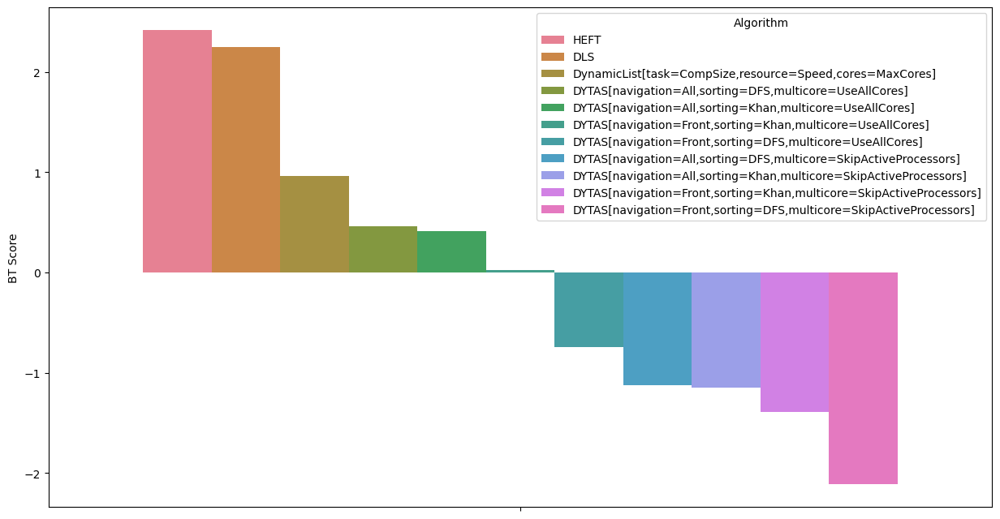

HEFT     DLS  \
Algorithm                                          Result                   
HEFT                                               B               26.73%   
                                                   E               58.67%   
                                                   W               14.60%   
DLS                                                B       14.60%           
                                                   E       58.67%           
                                                   W       26.73%           
DynamicList[task=CompSize,resource=Speed,cores=... B       11.35%  12.70%   
                                                   E        0.56%   0.56%   
                                                   W       88.09%  86.74%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B        9.55%   9.65%   
                                                   E        2.53%   2.53%   
                                                   W       87.92%  87.82%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B        7.97%   8.06%   
                                                   E        1.55%   1.55%   
                                                   W       90.48%  90.39%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B        6.78%   6.86%   
                                                   E        0.19%   0.19%   
                                                   W       93.03%  92.95%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B        5.57%   5.66%   
                                                   E        0.61%   0.61%   
                                                   W       93.82%  93.73%   
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B        7.29%   7.39%   
                                                   E        0.00%   0.00%   
                                                   W       92.71%  92.61%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B        6.51%   6.60%   
                                                   E        0.00%   0.00%   
                                                   W       93.49%  93.40%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B        6.31%   6.39%   
                                                   E        0.00%   0.00%   
                                                   W       93.69%  93.61%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B        5.68%   5.76%   
                                                   E        0.00%   0.00%   
                                                   W       94.32%  94.24%   

                                                          DynamicList[task=CompSize,resource=Speed,cores=MaxCores]  \
Algorithm                                          Result                                                            
HEFT                                               B                                                  88.09%         
                                                   E                                                   0.56%         
                                                   W                                                  11.35%         
DLS                                                B                                                  86.74%         
                                                   E                                                   0.56%         
                                                   W                                                  12.70%         
DynamicList[task=CompSize,resource=Speed,cores=... B                                                                 
                                                   E                                                                 
                                                   W                                                                 
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B               

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fbb7aa1ec00>, {('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 12.698114781448115, 'E': 0.5630630630630631, 'W': 86.73882215548882}, ('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 86.73882215548882, 'E': 0.5630630630630631, 'W': 12.698114781448115}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'HEFT'): {'B': 11.34884884884885, 'E': 0.5630630630630631, 'W': 88.08808808808809}, ('HEFT', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 88.08808808808809, 'E': 0.5630630630630631, 'W': 11.34884884884885}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]'): {'B': 67.97839506172839, 'E': 1.334668001334668, 'W': 30.686936936936938}, ('DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 30.6

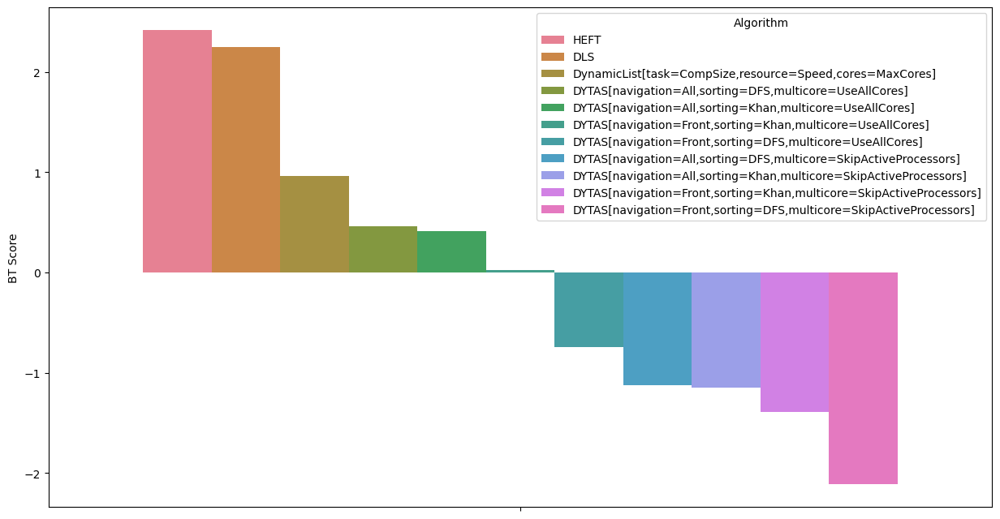

HEFT     DLS  \
Algorithm                                          Result                   
HEFT                                               B               26.73%   
                                                   E               58.67%   
                                                   W               14.60%   
DLS                                                B       14.60%           
                                                   E       58.67%           
                                                   W       26.73%           
DynamicList[task=CompSize,resource=Speed,cores=... B       11.35%  12.70%   
                                                   E        0.56%   0.56%   
                                                   W       88.09%  86.74%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B        9.55%   9.65%   
                                                   E        2.53%   2.53%   
                                                   W       87.92%  87.82%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B        7.97%   8.06%   
                                                   E        1.55%   1.55%   
                                                   W       90.48%  90.39%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B        6.78%   6.86%   
                                                   E        0.19%   0.19%   
                                                   W       93.03%  92.95%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B        5.57%   5.66%   
                                                   E        0.61%   0.61%   
                                                   W       93.82%  93.73%   
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B        7.29%   7.39%   
                                                   E        0.00%   0.00%   
                                                   W       92.71%  92.61%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B        6.51%   6.60%   
                                                   E        0.00%   0.00%   
                                                   W       93.49%  93.40%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B        6.31%   6.39%   
                                                   E        0.00%   0.00%   
                                                   W       93.69%  93.61%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B        5.68%   5.76%   
                                                   E        0.00%   0.00%   
                                                   W       94.32%  94.24%   

                                                          DynamicList[task=CompSize,resource=Speed,cores=MaxCores]  \
Algorithm                                          Result                                                            
HEFT                                               B                                                  88.09%         
                                                   E                                                   0.56%         
                                                   W                                                  11.35%         
DLS                                                B                                                  86.74%         
                                                   E                                                   0.56%         
                                                   W                                                  12.70%         
DynamicList[task=CompSize,resource=Speed,cores=... B                                                                 
                                                   E                                                                 
                                                   W                                                                 
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B               

defaultdict(<function calculate_pairwise_comparison.<locals>.<lambda> at 0x7fbb7a871d00>, {('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS'): {'B': 12.698114781448115, 'E': 0.5630630630630631, 'W': 86.73882215548882}, ('DLS', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 86.73882215548882, 'E': 0.5630630630630631, 'W': 12.698114781448115}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'HEFT'): {'B': 11.34884884884885, 'E': 0.5630630630630631, 'W': 88.08808808808809}, ('HEFT', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 88.08808808808809, 'E': 0.5630630630630631, 'W': 11.34884884884885}, ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]'): {'B': 67.97839506172839, 'E': 1.334668001334668, 'W': 30.686936936936938}, ('DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]', 'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 30.6

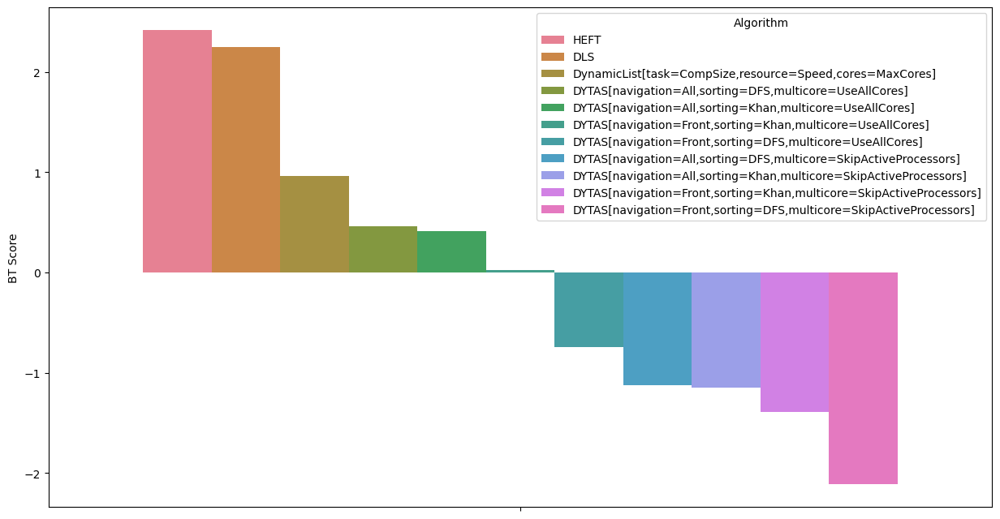

HEFT     DLS  \
Algorithm                                          Result                   
HEFT                                               B               26.73%   
                                                   E               58.67%   
                                                   W               14.60%   
DLS                                                B       14.60%           
                                                   E       58.67%           
                                                   W       26.73%           
DynamicList[task=CompSize,resource=Speed,cores=... B       11.35%  12.70%   
                                                   E        0.56%   0.56%   
                                                   W       88.09%  86.74%   
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B        9.55%   9.65%   
                                                   E        2.53%   2.53%   
                                                   W       87.92%  87.82%   
DYTAS[navigation=All,sorting=Khan,multicore=Use... B        7.97%   8.06%   
                                                   E        1.55%   1.55%   
                                                   W       90.48%  90.39%   
DYTAS[navigation=Front,sorting=Khan,multicore=U... B        6.78%   6.86%   
                                                   E        0.19%   0.19%   
                                                   W       93.03%  92.95%   
DYTAS[navigation=Front,sorting=DFS,multicore=Us... B        5.57%   5.66%   
                                                   E        0.61%   0.61%   
                                                   W       93.82%  93.73%   
DYTAS[navigation=All,sorting=DFS,multicore=Skip... B        7.29%   7.39%   
                                                   E        0.00%   0.00%   
                                                   W       92.71%  92.61%   
DYTAS[navigation=All,sorting=Khan,multicore=Ski... B        6.51%   6.60%   
                                                   E        0.00%   0.00%   
                                                   W       93.49%  93.40%   
DYTAS[navigation=Front,sorting=Khan,multicore=S... B        6.31%   6.39%   
                                                   E        0.00%   0.00%   
                                                   W       93.69%  93.61%   
DYTAS[navigation=Front,sorting=DFS,multicore=Sk... B        5.68%   5.76%   
                                                   E        0.00%   0.00%   
                                                   W       94.32%  94.24%   

                                                          DynamicList[task=CompSize,resource=Speed,cores=MaxCores]  \
Algorithm                                          Result                                                            
HEFT                                               B                                                  88.09%         
                                                   E                                                   0.56%         
                                                   W                                                  11.35%         
DLS                                                B                                                  86.74%         
                                                   E                                                   0.56%         
                                                   W                                                  12.70%         
DynamicList[task=CompSize,resource=Speed,cores=... B                                                                 
                                                   E                                                                 
                                                   W                                                                 
DYTAS[navigation=All,sorting=DFS,multicore=UseA... B               

In [91]:
(bt_scores, comparison_stats_scores) = calculate_comparison_on_all_metrics(df)

In [92]:
bt_scores

{'makespan':                                             Algorithm  BT Score
 0                                                HEFT  2.416272
 1                                                 DLS  2.246147
 2   DynamicList[task=CompSize,resource=Speed,cores...  0.960595
 3   DYTAS[navigation=All,sorting=DFS,multicore=Use...  0.462442
 4   DYTAS[navigation=All,sorting=Khan,multicore=Us...  0.413971
 5   DYTAS[navigation=Front,sorting=Khan,multicore=...  0.022356
 6   DYTAS[navigation=Front,sorting=DFS,multicore=U... -0.746777
 7   DYTAS[navigation=All,sorting=DFS,multicore=Ski... -1.127174
 8   DYTAS[navigation=All,sorting=Khan,multicore=Sk... -1.145966
 9   DYTAS[navigation=Front,sorting=Khan,multicore=... -1.389843
 10  DYTAS[navigation=Front,sorting=DFS,multicore=S... -2.112023,
 'SLR':                                             Algorithm  BT Score
 0                                                HEFT  2.416530
 1                                                 DLS  2.246405
 2   

In [93]:
df["scheduler"].unique()

array(['DynamicList[task=CompSize,resource=Speed,cores=MaxCores]', 'DLS',
       'HEFT', 'DYTAS[navigation=All,sorting=Khan,multicore=UseAllCores]',
       'DYTAS[navigation=All,sorting=DFS,multicore=UseAllCores]',
       'DYTAS[navigation=Front,sorting=Khan,multicore=UseAllCores]',
       'DYTAS[navigation=Front,sorting=DFS,multicore=UseAllCores]',
       'DYTAS[navigation=All,sorting=Khan,multicore=SkipActiveProcessors]',
       'DYTAS[navigation=All,sorting=DFS,multicore=SkipActiveProcessors]',
       'DYTAS[navigation=Front,sorting=Khan,multicore=SkipActiveProcessors]',
       'DYTAS[navigation=Front,sorting=DFS,multicore=SkipActiveProcessors]'],
      dtype=object)

In [94]:
comparison_stats_scores

{'makespan': defaultdict(<function __main__.calculate_pairwise_comparison.<locals>.<lambda>()>,
             {('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]',
               'DLS'): {'B': 12.698114781448115,
               'E': 0.5630630630630631,
               'W': 86.73882215548882},
              ('DLS',
               'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 86.73882215548882,
               'E': 0.5630630630630631,
               'W': 12.698114781448115},
              ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]',
               'HEFT'): {'B': 11.34884884884885,
               'E': 0.5630630630630631,
               'W': 88.08808808808809},
              ('HEFT',
               'DynamicList[task=CompSize,resource=Speed,cores=MaxCores]'): {'B': 88.08808808808809,
               'E': 0.5630630630630631,
               'W': 11.34884884884885},
              ('DynamicList[task=CompSize,resource=Speed,cores=MaxCores]',
             

# Calculating the overall best based on the pairwise rank

In [95]:
bt_scores_df = pd.concat(bt_scores, names=["metric"]).reset_index(level=0).reset_index(drop=True)

In [96]:
bt_scores

{'makespan':                                             Algorithm  BT Score
 0                                                HEFT  2.416272
 1                                                 DLS  2.246147
 2   DynamicList[task=CompSize,resource=Speed,cores...  0.960595
 3   DYTAS[navigation=All,sorting=DFS,multicore=Use...  0.462442
 4   DYTAS[navigation=All,sorting=Khan,multicore=Us...  0.413971
 5   DYTAS[navigation=Front,sorting=Khan,multicore=...  0.022356
 6   DYTAS[navigation=Front,sorting=DFS,multicore=U... -0.746777
 7   DYTAS[navigation=All,sorting=DFS,multicore=Ski... -1.127174
 8   DYTAS[navigation=All,sorting=Khan,multicore=Sk... -1.145966
 9   DYTAS[navigation=Front,sorting=Khan,multicore=... -1.389843
 10  DYTAS[navigation=Front,sorting=DFS,multicore=S... -2.112023,
 'SLR':                                             Algorithm  BT Score
 0                                                HEFT  2.416530
 1                                                 DLS  2.246405
 2   

In [97]:
bt_scores_df

,metric,Algorithm,BT Score
0,makespan,HEFT,2.416272
1,makespan,DLS,2.246147
2,makespan,"DynamicList[task=CompSize,resource=Speed,cores...",0.960595
3,makespan,"DYTAS[navigation=All,sorting=DFS,multicore=Use...",0.462442
4,makespan,"DYTAS[navigation=All,sorting=Khan,multicore=Us...",0.413971
...,...,...,...
61,speedup,"DYTAS[navigation=Front,sorting=DFS,multicore=U...",-0.746777
62,speedup,"DYTAS[navigation=All,sorting=DFS,multicore=Ski...",-1.127174
63,speedup,"DYTAS[navigation=All,sorting=Khan,multicore=Sk...",-1.145966
64,speedup,"DYTAS[navigation=Front,sorting=Khan,multicore=...",-1.389843


In [98]:
# bt_scores_df.metric.unique()

In [99]:
bt_scores_df2 = bt_scores_df[~(bt_scores_df["metric"].isin(["makespan", "efficiency_cores", "efficiency_processors", "exec_time"]))]

In [100]:
# bt_scores_df2

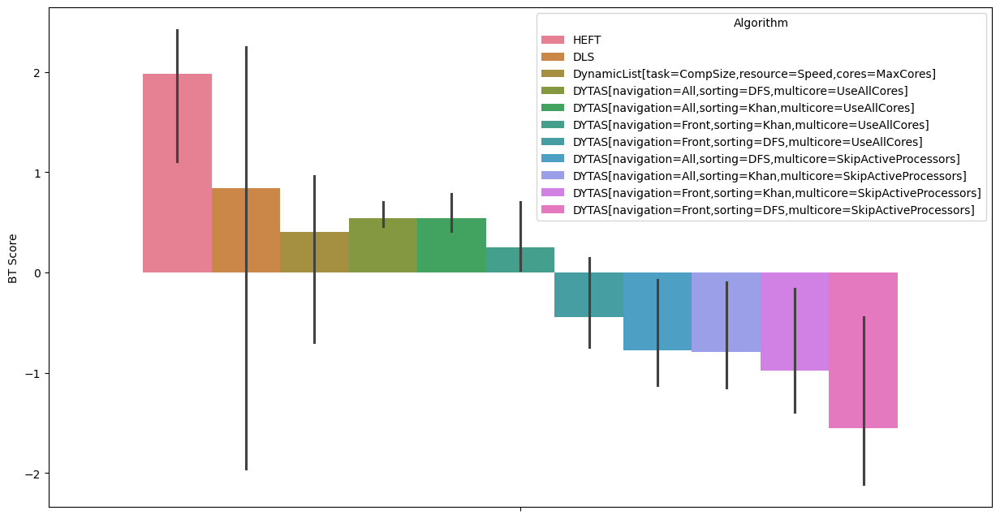

In [101]:
plt.figure(figsize=(15,8))
# bt_scores_df = bt_scores_df.sort_values(by="BT Score", ascending=False)
sns.barplot(data=bt_scores_df, hue="Algorithm",y="BT Score")
plt.show()

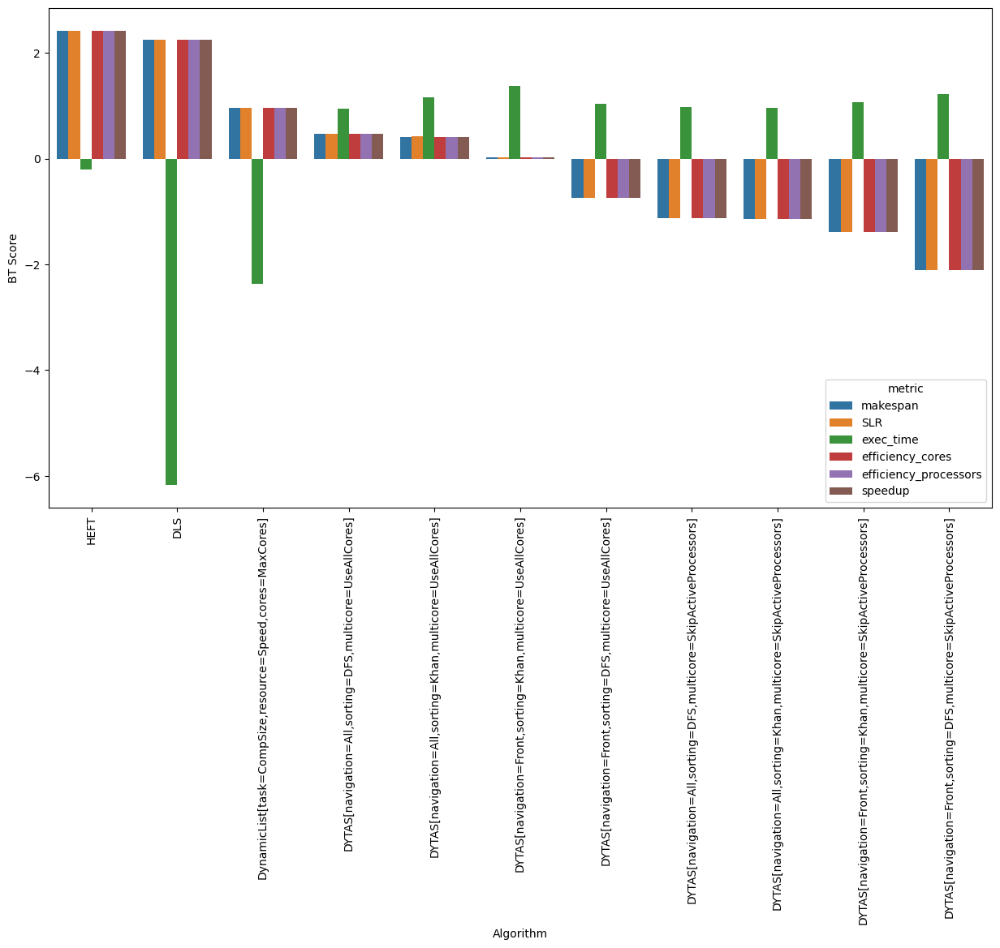

In [102]:
plt.figure(figsize=(15,8))
# bt_scores_df = bt_scores_df.sort_values(by="BT Score", ascending=False)
sns.barplot(data=bt_scores_df, hue="metric",x="Algorithm",y="BT Score")
plt.xticks(rotation=90)
plt.show()

Try recalculating the mean scores below again only using key metrics rather than all. There might be some skewness in the data because of overly similar metrics (makespan, slr), (speedup, efficiency)

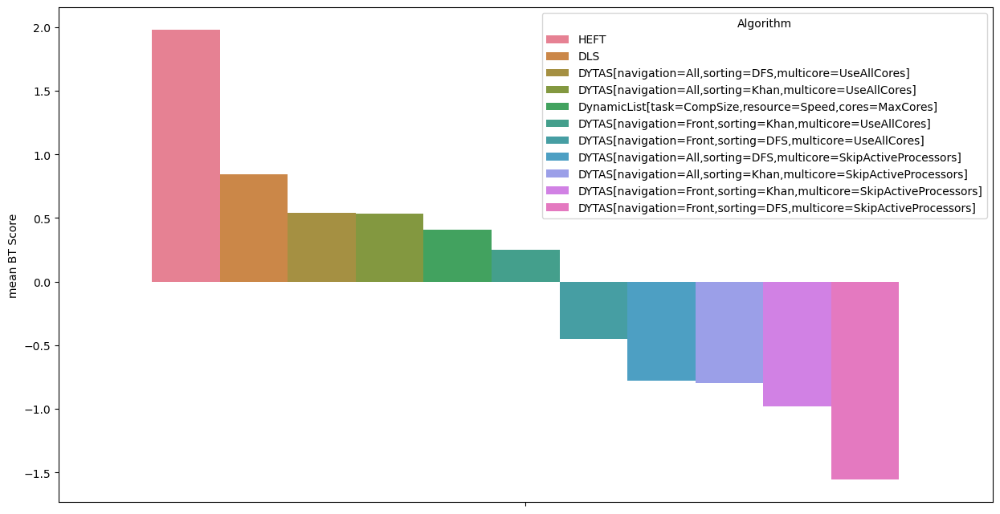

In [103]:
mean_bt_scores_df = bt_scores_df[["BT Score", "Algorithm"]].groupby("Algorithm").mean()
mean_bt_scores_df = mean_bt_scores_df.rename(columns={"BT Score":"mean BT Score"})
mean_bt_scores_df = mean_bt_scores_df.sort_values(by="mean BT Score", ascending=False)
plt.figure(figsize=(15,8))
sns.barplot(data=mean_bt_scores_df, hue="Algorithm",y="mean BT Score")
plt.show()

In [104]:
# comparison_stats_scores

In [105]:
# print("test")
# print("lol")

In [106]:
# algorithms = []
# for algos in pd.DataFrame(comparison_stats_scores).index:
#     try:
#         algo1, algo2 = algos
#         if algo1 not in algorithms:
#             algorithms.append(algo1)
#     except:
#         continue

In [107]:
# algorithms

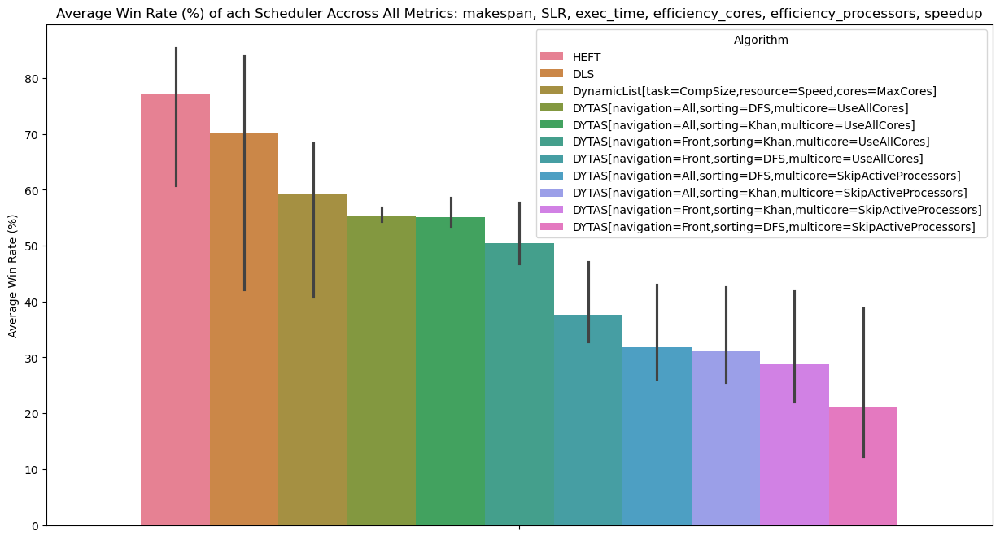

In [108]:
win_rates_dic = {}
for metric, val in comparison_stats_scores.items():
    ranks = rank_pairwise_comparison(val)
    win_rates_dic[metric] = pd.DataFrame(ranks.reset_index(names="Algorithm"))

win_rates_df = pd.concat(win_rates_dic, names=["metric"]).reset_index(level=0).reset_index(drop=True)

plt.figure(figsize=(15,8))
sns.barplot(data=win_rates_df, hue="Algorithm",y="Average Win Rate (%)")
plt.title("Average Win Rate (%) of ach Scheduler Accross All Metrics: " + ", ".join(win_rates_df.metric.unique()))
plt.show()

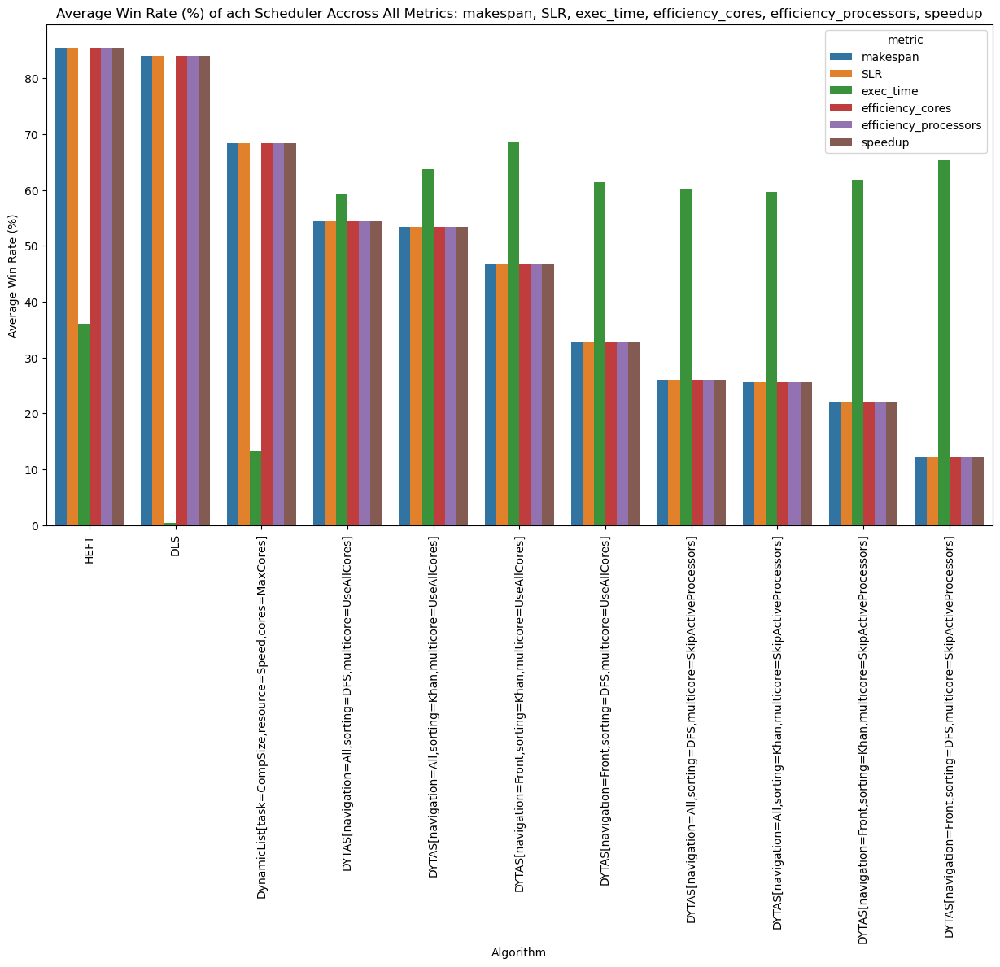

In [109]:
plt.figure(figsize=(15,8))
sns.barplot(data=win_rates_df, hue="metric",x="Algorithm",y="Average Win Rate (%)")
plt.title("Average Win Rate (%) of ach Scheduler Accross All Metrics: " + ", ".join(win_rates_df.metric.unique()))
plt.xticks(rotation=90)
plt.show()

In [110]:
# win_rates_df = pd.concat(win_rates_dic, names=["metric"]).reset_index(level=0).reset_index(drop=True)
# mean_win_rates_df = win_rates_df[["Average Win Rate (%)", "Algorithm"]].groupby("Algorithm").mean()
# # win_rates_df = win_rates_df.rename(columns={"BT Score":"Mean Win Rate (%)"})
# mean_win_rates_df = mean_win_rates_df.sort_values(by="Average Win Rate (%)", ascending=False)
# plt.figure(figsize=(15,8))
# sns.barplot(data=mean_win_rates_df, hue="Algorithm",y="Average Win Rate (%)")
# plt.show()


In [111]:
# win_rates_df

In [112]:
# mean_win_rate_df = win_rates_df[["Average Win Rate (%)", "Algorithm"]].groupby("Algorithm").mean()

In [113]:
# mean_win_rate_df

# Verifying the heterogeneous and homogeneous system performance between algorithms

To either accept or reject my hypothesis: HEFT will perform better in heterogeneous systems and DYTAS better in homogeneous systems.

In [114]:
df.loc[df.system.str.contains("het"), "system_type"]  = "heterogeneous"

In [115]:
df.loc[df.system.str.contains("hom"), "system_type"]  = "homogeneous"

In [116]:
len(df[df.system_type=="homogeneous"])

263736

In [117]:
len(df[df.system_type=="heterogeneous"])

263736

<Axes: xlabel='SLR'>

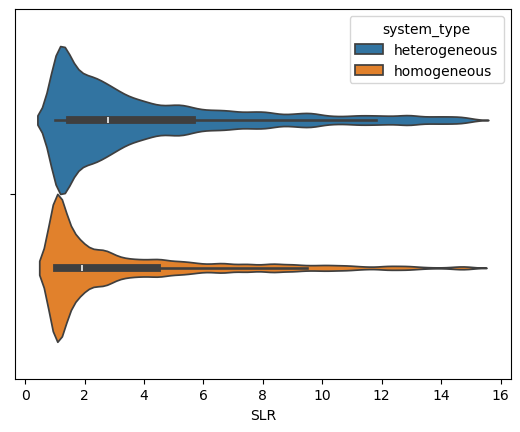

In [118]:
sns.violinplot(data=df[df.SLR < 15], x="SLR", hue="system_type")

In [ ]:
plt.figure(figsize=(10,15))
sns.violinplot(data=df[df.SLR < 15], x="SLR", hue="system_type", y="scheduler")
plt.show()

In [ ]:
plt.figure(figsize=(10,15))
sns.violinplot(data=df[df.speedup < 20], x="speedup", hue="system_type", y="scheduler")
plt.show()

In [ ]:
plt.figure(figsize=(10,15))
sns.barplot(data=df.sort_values(by="SLR"), x="SLR", hue="system_type", y="scheduler")
plt.show()

In [ ]:
plt.figure(figsize=(10,15))
sns.barplot(data=df.sort_values(by="speedup"), x="speedup", hue="system_type", y="scheduler")
plt.show()

In [ ]:
plt.figure(figsize=(10,15))
sns.barplot(data=df.sort_values(by="efficiency_cores"), x="efficiency_cores", hue="system_type", y="scheduler")
plt.show()

In [ ]:
plt.figure(figsize=(10,15))
sns.barplot(data=df.sort_values(by="efficiency_processors"), x="efficiency_processors", hue="system_type", y="scheduler")
plt.show()

In [ ]:
(bt_scores_het, comparison_stats_scores_het) = calculate_comparison_on_all_metrics(df[df.system_type == "heterogeneous"])

In [ ]:
win_rates_dic = {}
for metric, val in comparison_stats_scores_het.items():
    ranks = rank_pairwise_comparison(val)
    win_rates_dic[metric] = pd.DataFrame(ranks.reset_index(names="Algorithm"))

win_rates_df = pd.concat(win_rates_dic, names=["metric"]).reset_index(level=0).reset_index(drop=True)

plt.figure(figsize=(15,8))
sns.barplot(data=win_rates_df, hue="metric",x="Algorithm",y="Average Win Rate (%)")
plt.xticks(rotation=90)
plt.title("Average Win Rate (%) of ach Scheduler Accross All Metrics: " + ", ".join(win_rates_df.metric.unique()))
plt.show()

In [ ]:
(bt_scores_hom, comparison_stats_scores_hom) = calculate_comparison_on_all_metrics(df[df.system_type == "homogeneous"])

In [ ]:
win_rates_dic = {}
for metric, val in comparison_stats_scores_hom.items():
    ranks = rank_pairwise_comparison(val)
    win_rates_dic[metric] = pd.DataFrame(ranks.reset_index(names="Algorithm"))

win_rates_df = pd.concat(win_rates_dic, names=["metric"]).reset_index(level=0).reset_index(drop=True)
win_rates_df = win_rates_df.sort_values(by="Average Win Rate (%)", ascending=False)

plt.figure(figsize=(15,8))
sns.barplot(data=win_rates_df, hue="metric",x="Algorithm",y="Average Win Rate (%)")
plt.xticks(rotation=90)
plt.title("Average Win Rate (%) of ach Scheduler Accross All Metrics: " + ", ".join(win_rates_df.metric.unique()))
plt.show()

# Impact of system network configurations

Eg. Network vs CCR

Core metrics: network_bandwidth, network_latency, network_model, run_stats.total_network_time, run_stats.total_network_traffic, CCR

The communication to computation ratio signfificantly increases as the network changes from `ConstantBandwidth` to `SharedBandwidth`

In [ ]:
plt.figure(figsize=(15,8))
sns.barplot(data=df, y="scheduler", x="CCR", hue="network_model")
plt.show()

There is also a significant difference between `network_model` accross the board for all algorithms in terms of `SLR`.

In [ ]:
plt.figure(figsize=(15,8))
sns.barplot(data=df, y="scheduler", x="SLR", hue="network_model")
plt.show()

In [ ]:
plt.figure(figsize=(15,8))
sns.barplot(data=df, y="scheduler", x="CCR", hue="network_bandwidth")
plt.show()

In [ ]:
plt.figure(figsize=(15,8))
sns.barplot(data=df, y="scheduler", x="SLR", hue="network_bandwidth")
plt.show()

There doesnt seem to be a noticeable impact between network latencies of 10, 100, 1000

In [ ]:
plt.figure(figsize=(15,8))
sns.barplot(data=df, y="scheduler", x="CCR", hue="network_latency")
plt.show()

In [ ]:
plt.figure(figsize=(15,8))
sns.barplot(data=df, y="scheduler", x="SLR", hue="network_latency")
plt.show()

# TO DO: Verify the impact of DAG density

In [ ]:
# df_mean_slr = df[
#     ["SLR", "scheduler", "dag_density"]
# ].groupby(["scheduler"]).mean().reset_index()
# df_mean_slr = df_mean_slr.rename(columns={"SLR":"mean_SLR", "dag_density":"mean_dag_density"})

plt.figure(figsize=(15,8))

sns.scatterplot(
    data=df_mean_slr[(df_mean_slr.mean_dag_density < 0.029)],
    y="mean_SLR", x="mean_dag_density", hue="scheduler"
)

plt.show()

In [ ]:
sns.scatterplot(df[df.SLR < 20], x="dag_density", y="SLR")

In [ ]:
sns.scatterplot(df[(df.exec_time < 20) & (df.dag_density < 0.014)], x="dag_density", y="exec_time")

In [ ]:
sns.barplot(df, x="dag_density", y="exec_time", hue="workflow")

# TO DO: Anova tests

# TO DO: Paired tests